In [1]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

In [2]:
df = pd.read_csv('D:/College/sem 7/final year project/gith/AniSearch/anime.csv')
# df = df.reset_index()
df.head()

,Anime-PlanetID,Name,Alternative Name,Rating Score,Number Votes,Tags,Content Warning,Type,Episodes,Finished,Duration,StartYear,EndYear,Season,Studios,Synopsis,Url
0,10,The Prince of Tennis,Tennis no Ouji-sama,4.037,10889,"Comedy, Drama, Shounen, Sports, Tennis, Based ...",Unknown,TV,178,True,Unknown,2001,2005,Fall 2001,"Production I.G, Trans Arts","Meet Ryoma Echizen, the cocky prince of tennis...",https://www.anime-planet.com/anime/the-prince-...
1,100,Neon Genesis Evangelion,Shinseiki Evangelion,4.248,54463,"Drama, Mecha, Sci Fi, Conspiracy, Kaijuu, Lone...","Emotional Abuse, Explicit Violence, Mature The...",TV,26,True,Unknown,1995,1996,Fall 1995,"GAINAX, Tatsunoko Production","In the future, a devastating event known as Se...",https://www.anime-planet.com/anime/neon-genesi...
2,1000,Full Metal Panic! The Second Raid,Unknown,4.35,23948,"Action, Comedy, Mecha, Sci Fi, Shounen, Milita...","Explicit Violence, Nudity",TV,13,True,Unknown,2005,2005,Summer 2005,Kyoto Animation,Half a year has passed since Sousuke Sagara to...,https://www.anime-planet.com/anime/full-metal-...
3,10000,22/7: Shampoo no Nioi ga Shita,Unknown,2.8,131,"Idols, School Life, CG Animation",Unknown,Music,1,True,5,2018,2018,Unknown,Unknown,The idol group 22/7 perform the song Shampoo n...,https://www.anime-planet.com/anime/22-7-shampo...
4,10001,Oshiri Tantei: Puputto Fumutto Kaiketsu Dance,Unknown,1.271,21,Family Friendly,Unknown,Web,1,True,2,2017,2017,Unknown,Toei Animation,No synopsis yet - check back soon!,https://www.anime-planet.com/anime/oshiri-tant...


In [3]:
rows, columns = df.shape
print("Rows:", rows)
print("Columns:", columns)

Rows: 16621
Columns: 17


In [4]:
df.columns

Index(['Anime-PlanetID', 'Name', 'Alternative Name', 'Rating Score',
       'Number Votes', 'Tags', 'Content Warning', 'Type', 'Episodes',
       'Finished', 'Duration', 'StartYear', 'EndYear', 'Season', 'Studios',
       'Synopsis', 'Url'],
      dtype='object')

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the CSV file
# data = pd.read_csv('path to csv')  # Replace with your actual file name

# Drop rows with missing values
data = df
data = data.dropna()

# Convert 'Rating Score' to float and drop rows with invalid scores
data['Rating Score'] = pd.to_numeric(data['Rating Score'], errors='coerce')
data = data.dropna(subset=['Rating Score'])

# Sort the anime by 'Rating Score' in descending order and select the top 10
top_anime = data.sort_values(by='Rating Score', ascending=False).head(10)

# Debugging: Print the top 10 data to ensure it's populated
print(top_anime)




       Anime-PlanetID                                               Name  \
6257            15791                            Fruits Basket the Final   
8548             2360                   Fullmetal Alchemist: Brotherhood   
4013            13739                   Attack on Titan The Final Season   
4361            14059  Demon Slayer: Kimetsu no Yaiba Movie - Mugen T...   
2096            11965                Attack on Titan 3rd Season: Part II   
4546            14229                                     Jujutsu Kaisen   
14231            7777  Haikyuu!! Karasuno High School vs Shiratorizaw...   
13207            6805                                     A Silent Voice   
10587            4336                             Hunter x Hunter (2011)   
14089            7639                                         your name.   

                                        Alternative Name  Rating Score  \
6257                                             Unknown         4.716   
8548      Hagan

C:\Users\acer\AppData\Local\Temp\ipykernel_8768\1247414957.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Rating Score'] = pd.to_numeric(data['Rating Score'], errors='coerce')


### Plotting top 10 anime of all time (based on Rating-Score)

C:\Users\acer\AppData\Local\Temp\ipykernel_8768\543764633.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_anime, x='Rating Score', y='Name', palette='plasma')  # Use DataFrame columns directly


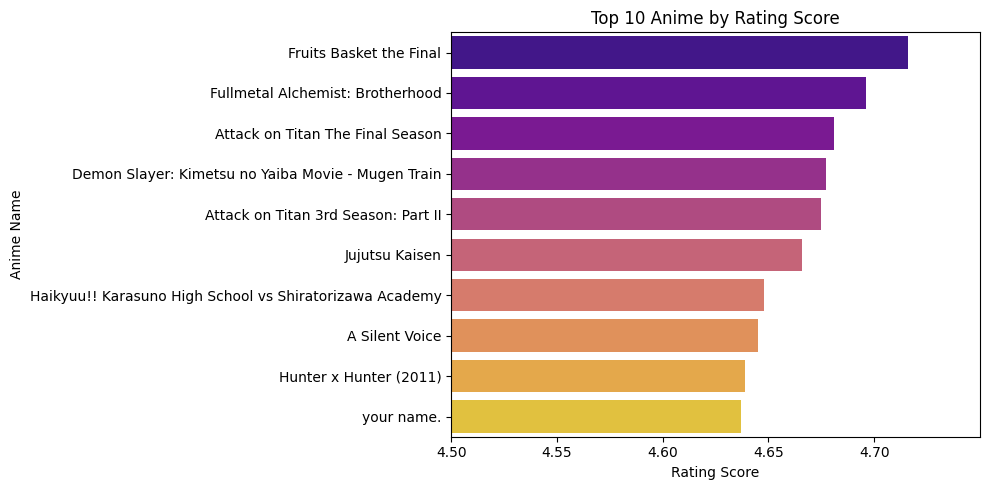

In [6]:
# Plotting with Seaborn
plt.figure(figsize=(10, 5))
sns.barplot(data=top_anime, x='Rating Score', y='Name', palette='plasma')  # Use DataFrame columns directly
plt.xlabel('Rating Score')
plt.ylabel('Anime Name')
plt.title('Top 10 Anime by Rating Score')

# Set x-axis ticks and labels from 4.5 to 4.7 with a gap of 0.05
plt.xticks(ticks=[x * 0.05 + 4.5 for x in range(5)], labels=[f'{x * 0.05 + 4.5:.2f}' for x in range(5)])

# Set x-axis limits from 4.5 to 4.7
plt.xlim(4.5, 4.75)

plt.tight_layout()
plt.show()

In [7]:
features = ['Rating Score','Number Votes','Studios','Synopsis', 'Tags', 'Episodes']

In [8]:
def combined_features(row):
    return str(row["Rating Score"])+" "+ str(row["Number Votes"])+" "+ str(row["Studios"])+" "+ str(row["Synopsis"])+" "+ str(row["Tags"])+" "+ str(row["Episodes"])+" "

def get_title_from_index(index):
    return df[df["index"] == index]["Name"].values[0]
def get_index_from_title(title):
    return df[df["Name"] == title]["index"].values[0]

In [9]:
df["combined_feature"]=df.apply(combined_features,axis=1)
df["combined_feature"].head()

0    4.037 10889 Production I.G, Trans Arts Meet Ry...
1    4.248 54463 GAINAX, Tatsunoko Production In th...
2    4.35 23948 Kyoto Animation Half a year has pas...
3    2.8 131 Unknown The idol group 22/7 perform th...
4    1.271 21 Toei Animation No synopsis yet - chec...
Name: combined_feature, dtype: object

In [10]:
rows, columns = df.shape
print(rows, columns)

16621 18


In [11]:
print(df.columns)

Index(['Anime-PlanetID', 'Name', 'Alternative Name', 'Rating Score',
       'Number Votes', 'Tags', 'Content Warning', 'Type', 'Episodes',
       'Finished', 'Duration', 'StartYear', 'EndYear', 'Season', 'Studios',
       'Synopsis', 'Url', 'combined_feature'],
      dtype='object')


In [12]:
# import pandas as pd

# # Load the dataset
# # data = pd.read_csv('..\\anime.csv')  
# data=df

# # Drop rows with NaN values
# data_cleaned = data.dropna()

# # Replace 'unknown' values with NaN and drop them
# data_cleaned = data_cleaned.replace('unknown', pd.NA).dropna()

# # Print the number of remaining data points
# print("Remaining data points:", len(data_cleaned))


In [13]:
cv = CountVectorizer()
count_matrix=cv.fit_transform(df["combined_feature"])

In [14]:
anime_liked = "naruto"


In [15]:
cosine_sim = cosine_similarity(count_matrix)
from difflib import get_close_matches


def get_index_from_title(title):
    title = title.strip().lower()
    df["Name"] = df["Name"].str.strip().str.lower()
    matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)  
    if matches:
        title = matches[0]  
        return df[df["Name"] == title]["index"].values[0]
    else:
        raise ValueError(f"No close matches found for '{title}'.")

try:
    liked_movie_index = cosine_sim[get_index_from_title(anime_liked)]
    similar_anime = list(enumerate(liked_movie_index))
    similar_anime.sort(key=lambda row: row[1], reverse=True)
    for i in range(15):
        print(get_title_from_index(similar_anime[i][0]))
except Exception as e:
    print(f"Error: {e}")


Error: 'index'


#### Recommendation using Cosine Similarity

In [16]:
# from difflib import get_close_matches
# from sklearn.metrics import precision_score, recall_score, f1_score, mean_absolute_error
# from sklearn.model_selection import train_test_split
# import numpy as np
# import pandas as pd

# def get_index_from_title(title):
#     title = title.strip().lower()
#     df["Name"] = df["Name"].str.strip().str.lower()
#     matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)  
#     if matches:
#         title = matches[0]  
#         return df[df["Name"] == title]["index"].values[0]
#     else:
#         raise ValueError(f"No close matches found for '{title}'.")

# df['Rating Score'] = pd.to_numeric(df['Rating Score'], errors='coerce')
# df['Number Votes'] = pd.to_numeric(df['Number Votes'], errors='coerce')

# train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# try:
    
#     y_true = []
#     y_pred = []
#     mae_scores = []
    
#     for idx, row in test_df.iterrows():
#         true_rating = row['Rating Score']
#         anime_name = row['Name']
        
#         liked_movie_index = cosine_sim[get_index_from_title(anime_name)]
#         similar_anime = list(enumerate(liked_movie_index))
#         similar_anime.sort(key=lambda x: x[1], reverse=True)
        
#         recommended_indices = [x[0] for x in similar_anime[1:31]]  
        
#         pred_ratings = df.iloc[recommended_indices]['Rating Score'].mean()
        
#         y_true.append(1 if true_rating >= 4.0 else 0)
#         y_pred.append(1 if pred_ratings >= 4.0 else 0)
        
#         mae_scores.append(abs(true_rating - pred_ratings))
        
    
#     precision = precision_score(y_true, y_pred)
#     recall = recall_score(y_true, y_pred)
#     f1 = f1_score(y_true, y_pred)
#     mae = np.mean(mae_scores)
    
#     print(f"\nRecommendations for {anime_liked} (Cosine Similarity):")
#     liked_movie_index = cosine_sim[get_index_from_title(anime_liked)]
#     similar_anime = list(enumerate(liked_movie_index))
#     similar_anime.sort(key=lambda row: row[1], reverse=True)
#     for i in range(15):
#         print(get_title_from_index(similar_anime[i][0]))
        
#     print("\n")
#     print()
    
#     print(f"Precision: {precision:.3f}")
#     print(f"Recall: {recall:.3f}")
#     print(f"F1 Score: {f1:.3f}")
#     print(f"Mean Absolute Error: {mae:.3f}")
    
        
# except Exception as e:
#     print(f"Error: {e}")


In [17]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd
import numpy as np

# Fill NaN values with empty strings
df['Tags'] = df['Tags'].fillna('')
df['Studios'] = df['Studios'].fillna('')
df['Type'] = df['Type'].fillna('Unknown')
df['Synopsis'] = df['Synopsis'].fillna('')  # Ensure no NaN values in synopsis

# Convert 'Number Votes' to numeric and scale it
df['Number Votes'] = pd.to_numeric(df['Number Votes'], errors='coerce').fillna(0)
scaler = StandardScaler()
scaled_votes = scaler.fit_transform(df[['Number Votes']])

# TF-IDF Vectorization for Tags
tag_vectorizer = TfidfVectorizer(stop_words='english', max_features=600)
tag_matrix = tag_vectorizer.fit_transform(df['Tags']).toarray()

# TF-IDF Vectorization for Synopsis
synopsis_vectorizer = TfidfVectorizer(stop_words='english', max_features=1500)  # More features for better representation
synopsis_matrix = synopsis_vectorizer.fit_transform(df['Synopsis']).toarray()

# One-Hot Encoding for Studios and Type
encoder = OneHotEncoder()
studios_encoded = encoder.fit_transform(df[['Studios']]).toarray()
type_encoded = encoder.fit_transform(df[['Type']]).toarray()

# Combine all features
features_combined = np.hstack([scaled_votes, tag_matrix, synopsis_matrix, studios_encoded, type_encoded])

print("Feature matrix shape:", features_combined.shape)


Feature matrix shape: (16621, 3153)


#### Recommendation using k-Means

In [18]:
# from sklearn.cluster import KMeans
# from sklearn.metrics import precision_score, recall_score, f1_score, mean_absolute_error

# # Perform KMeans
# kmeans = KMeans(n_clusters=20, random_state=42)
# clusters = kmeans.fit_predict(features_combined)

# df['KMeans_Cluster'] = clusters

# def recommend_anime_kmeans(title, top_n=10):
#     anime_index = get_index_from_title(title)
#     anime_cluster = df.loc[anime_index, 'KMeans_Cluster']
    
#     similar_anime = df[df['KMeans_Cluster'] == anime_cluster]
    
#     recommended_anime = similar_anime[similar_anime['Name'] != title].head(top_n)['Name'].values
#     return recommended_anime

# recommended_anime_kmeans = recommend_anime_kmeans(anime_liked)
# print(f"Anime similar to '{anime_liked}' based on KMeans clustering:")
# for anime in recommended_anime_kmeans:
#     print(anime)

# true_labels = (df['KMeans_Cluster'] == df.loc[get_index_from_title(anime_liked), 'KMeans_Cluster']).astype(int)
# pred_labels = np.zeros(len(df))
# recommended_indices = [get_index_from_title(anime) for anime in recommended_anime_kmeans]
# pred_labels[recommended_indices] = 1

# precision = precision_score(true_labels, pred_labels)
# recall = recall_score(true_labels, pred_labels)
# f1 = f1_score(true_labels, pred_labels)
# df['Rating Score'] = pd.to_numeric(df['Rating Score'].replace('Unknown', np.nan), errors='coerce')
# df['Rating Score'] = df['Rating Score'].fillna(df['Rating Score'].mean())

# true_ratings = df['Rating Score'].values
# pred_ratings = np.zeros(len(df))
# pred_ratings[recommended_indices] = df.loc[get_index_from_title(anime_liked), 'Rating Score']
# mae = mean_absolute_error(true_ratings, pred_ratings)

# print("\nMetrics:")
# print(f"Precision: {precision:.3f}")
# print(f"Recall: {recall:.3f}")
# print(f"F1 Score: {f1:.3f}")
# print(f"Mean Absolute Error: {mae:.3f}")


#### Recommendation using KNN

In [19]:
# from sklearn.neighbors import NearestNeighbors
# from sklearn.metrics import precision_score, recall_score, f1_score, mean_absolute_error

# knn = NearestNeighbors(n_neighbors=11, metric='cosine')  
# knn.fit(features_combined)

# # Function to recommend based on KNN
# def recommend_anime_knn(title, top_n=10):
#     anime_index = get_index_from_title(title)
    
#     distances, indices = knn.kneighbors(features_combined[anime_index].reshape(1, -1))
    
#     recommended_anime = df.iloc[indices[0][1:top_n+1]]['Name'].values
#     return recommended_anime

# recommended_anime_knn = recommend_anime_knn(anime_liked)
# print(f"Anime similar to '{anime_liked}' based on KNN:")
# for anime in recommended_anime_knn:
#     print(anime)




##### KNN using Cosine-Sim (without normalization)

In [20]:
cosine_sim = cosine_similarity(count_matrix)
from difflib import get_close_matches

def get_index_from_title(title):
    title = title.strip().lower()
    df["Name"] = df["Name"].str.strip().str.lower()
    matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)  
    if matches:
        title = matches[0]  
        return df[df["Name"] == title]["index"].values[0]
    else:
        raise ValueError(f"No close matches found for '{title}'.")

try:
    liked_movie_index = get_index_from_title(anime_liked)
    similarity_scores = cosine_sim[liked_movie_index] 
    # Get similarity scores for the liked anime
    similar_anime = list(enumerate(similarity_scores)) 
    similar_anime.sort(key=lambda row: row[1], reverse=True)  # Sort by similarity score (highest first)

    print(f"Anime similar to '{anime_liked}' based on Cosine Similarity:\n")

    max_name_length = max(len(get_title_from_index(anime[0])) for anime in similar_anime[:15])  # Find longest name

    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        similarity_score = similar_anime[i][1]
        distance = 1 - similarity_score  # Cosine distance

        print(f"{anime_name.ljust(max_name_length)}  |  Distance: {distance:.4f}  |  Similarity: {similarity_score:.4f}")

except Exception as e:
    print(f"Error: {e}")



Error: 'index'


In [21]:
cosine_sim = cosine_similarity(count_matrix)
from difflib import get_close_matches

def get_index_from_title(title):
    title = title.strip().lower()
    df["Name"] = df["Name"].str.strip().str.lower()
    matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)  
    if matches:
        title = matches[0]  
        return df[df["Name"] == title]["index"].values[0]
    else:
        raise ValueError(f"No close matches found for '{title}'.")

try:
    liked_movie_index = get_index_from_title(anime_liked)
    similarity_scores = cosine_sim[liked_movie_index] 
    min_distance = np.min(similarity_scores)
    max_distance = np.max(similarity_scores)
    # Get similarity scores for the liked anime
    similar_anime = list(enumerate(similarity_scores)) 
    similar_anime.sort(key=lambda row: row[1], reverse=True)  # Sort by similarity score (highest first)

    print(f"Anime similar to '{anime_liked}' based on Cosine Similarity:\n")

    max_name_length = max(len(get_title_from_index(anime[0])) for anime in similar_anime[:15])  # Find longest name

    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        original_distance = similar_anime[i][1]
        normalized_distance = (original_distance - min_distance) / (max_distance - min_distance)
        normalized_similarity = 1 - normalized_distance # Cosine distance

        print(f"{anime_name.ljust(max_name_length)}  |  Distance: {normalized_distance:.4f}  |  Similarity: {normalized_similarity:.4f}")

except Exception as e:
    print(f"Error: {e}")



Error: 'index'


##### KNN using Manhattan (without normalization)

In [22]:
from scipy.spatial.distance import cdist
from difflib import get_close_matches

def get_index_from_title(title):
    title = title.strip().lower()
    df["Name"] = df["Name"].str.strip().str.lower()
    matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)  
    if matches:
        title = matches[0]  
        return df[df["Name"] == title]["index"].values[0]
    else:
        raise ValueError(f"No close matches found for '{title}'.")

try:
    liked_movie_index = get_index_from_title(anime_liked)
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='cityblock').flatten()
    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower Manhattan distance means higher similarity

    print(f"Anime similar to '{anime_liked}' based on Manhattan Distance:\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        distance = similar_anime[i][1]
        similarity_score = 1 / (1 + distance)  # Convert distance to similarity (closer = higher similarity)
        print(f"{anime_name} - \t\tDistance: {distance:.4f}, \t\tSimilarity: {similarity_score:.4f}")

except Exception as e:
    print(f"Error: {e}")


Error: 'index'


##### KNN using Manhattan (with normalization)

In [23]:
from scipy.spatial.distance import cdist
from difflib import get_close_matches
import numpy as np

def get_index_from_title(title):
    title = title.strip().lower()
    df["Name"] = df["Name"].str.strip().str.lower()
    matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)  
    if matches:
        title = matches[0]  
        return df[df["Name"] == title]["index"].values[0]
    else:
        raise ValueError(f"No close matches found for '{title}'.")

try:
    liked_movie_index = get_index_from_title(anime_liked)
    
    # Compute Manhattan (Cityblock) Distance for all anime
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='cityblock').flatten()
    
    # Find Min & Max for Normalization
    min_distance = np.min(similarity_scores)
    max_distance = np.max(similarity_scores)

    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower Manhattan distance means higher similarity

    print(f"Anime similar to '{anime_liked}' based on Normalized Manhattan Distance:\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        original_distance = similar_anime[i][1]
        normalized_distance = (original_distance - min_distance) / (max_distance - min_distance)
        normalized_similarity = 1 - normalized_distance

        print(f"{anime_name} - \t\tDistance: {normalized_distance:.4f}, \t\tSimilarity: {normalized_similarity:.4f}")

except Exception as e:
    print(f"Error: {e}")


Error: 'index'


##### KNN using Euclidean (without normalization)

In [24]:
from scipy.spatial.distance import cdist

try:
    liked_movie_index = get_index_from_title(anime_liked)
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='euclidean').flatten()
    # Find Min & Max for Normalization
    min_distance = np.min(similarity_scores)
    max_distance = np.max(similarity_scores)

    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower Euclidean distance means higher similarity

    print(f"Anime similar to '{anime_liked}' based on Euclidean Distance:\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        distance = similar_anime[i][1]
        similarity_score = 1 / (1 + distance)
        print(f"{anime_name} - \t\tDistance: {distance:.4f}, \t\tSimilarity: {similarity_score:.4f}")

except Exception as e:
    print(f"Error: {e}")


Error: 'index'


##### KNN using Euclidean (with normalization)

In [25]:
from scipy.spatial.distance import cdist

try:
    liked_movie_index = get_index_from_title(anime_liked)
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='euclidean').flatten()
    # Find Min & Max for Normalization
    min_distance = np.min(similarity_scores)
    max_distance = np.max(similarity_scores)

    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower Euclidean distance means higher similarity

    print(f"Anime similar to '{anime_liked}' based on Euclidean Distance:\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        original_distance = similar_anime[i][1]
        normalized_distance = (original_distance - min_distance) / (max_distance - min_distance)
        normalized_similarity = 1 - normalized_distance
        print(f"{anime_name} - \t\tDistance: {normalized_distance:.4f}, \t\tSimilarity: {normalized_similarity:.4f}")

except Exception as e:
    print(f"Error: {e}")


Error: 'index'


##### KNN using minkowski (without normalization)

In [26]:
from scipy.spatial.distance import cdist
from difflib import get_close_matches
import numpy as np

# Function to get index of an anime from its title
def get_index_from_title(title):
    title = title.strip().lower()
    df["Name"] = df["Name"].str.strip().str.lower()
    matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)
    if matches:
        title = matches[0]
        return df[df["Name"] == title]["index"].values[0]
    else:
        raise ValueError(f"No close matches found for '{title}'.")

try:
    liked_movie_index = get_index_from_title(anime_liked)
    
    # Compute Minkowski Distance for all anime (p=3)
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='minkowski', p=3).flatten()
    
    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower distance means higher similarity
    
    print(f"Anime similar to '{anime_liked}' based on Minkowski Distance (p=3):\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        distance = similar_anime[i][1]
        similarity_score = 1 / (1 + distance)  # Convert distance to similarity
        print(f"{anime_name} - \t\tDistance: {distance:.4f}, \t\tSimilarity: {similarity_score:.4f}")

except Exception as e:
    print(f"Error: {e}")




Error: 'index'


##### KNN using minkowski (with normalization)

In [27]:
from scipy.spatial.distance import cdist
from difflib import get_close_matches
import numpy as np

# Function to get index of an anime from its title
def get_index_from_title(title):
    title = title.strip().lower()
    df["Name"] = df["Name"].str.strip().str.lower()
    matches = get_close_matches(title, df["Name"], n=1, cutoff=0.8)
    if matches:
        title = matches[0]
        return df[df["Name"] == title]["index"].values[0]
    else:
        raise ValueError(f"No close matches found for '{title}'.")
# With Normalization
try:
    liked_movie_index = get_index_from_title(anime_liked)
    
    # Compute Minkowski Distance for all anime (p=3)
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='minkowski', p=3).flatten()
    
    # Find Min & Max for Normalization
    min_distance = np.min(similarity_scores)
    max_distance = np.max(similarity_scores)
    
    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower distance means higher similarity
    
    print(f"Anime similar to '{anime_liked}' based on Normalized Minkowski Distance (p=3):\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        original_distance = similar_anime[i][1]
        normalized_distance = (original_distance - min_distance) / (max_distance - min_distance)
        normalized_similarity = 1 - normalized_distance
        print(f"{anime_name} - \t\tDistance: {normalized_distance:.4f}, \t\tSimilarity: {normalized_similarity:.4f}")

except Exception as e:
    print(f"Error: {e}")

Error: 'index'


##### KNN using Hamming (without normalization)

In [28]:
from scipy.spatial.distance import cdist

try:
    liked_movie_index = get_index_from_title(anime_liked)
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='hamming').flatten()
    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower Hamming distance means higher similarity

    print(f"Anime similar to '{anime_liked}' based on Hamming Distance:\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        distance = similar_anime[i][1]
        similarity_score = 1 - distance  # Hamming similarity is (1 - distance)
        print(f"{anime_name} - \t\tDistance: {distance:.4f}, \t\tSimilarity: {similarity_score:.4f}")

except Exception as e:
    print(f"Error: {e}")


Error: 'index'


##### KNN using Jaccard (without normalization)

In [29]:
from scipy.spatial.distance import cdist

try:
    liked_movie_index = get_index_from_title(anime_liked)
    similarity_scores = cdist([features_combined[liked_movie_index]], features_combined, metric='jaccard').flatten()
     # Find Min & Max for Normalization
    min_distance = np.min(similarity_scores)
    max_distance = np.max(similarity_scores)
    similar_anime = list(enumerate(similarity_scores))
    similar_anime.sort(key=lambda row: row[1])  # Lower Jaccard distance means higher similarity

    print(f"Anime similar to '{anime_liked}' based on Jaccard Distance:\n")
    for i in range(15):
        anime_name = get_title_from_index(similar_anime[i][0])
        original_distance = similar_anime[i][1]
        normalized_distance = (original_distance - min_distance) / (max_distance - min_distance)
        normalized_similarity = 1 - normalized_distance
        print(f"{anime_name} - \t\tDistance: {distance:.4f}, \t\tSimilarity: {similarity_score:.4f}")

except Exception as e:
    print(f"Error: {e}")


Error: 'index'


In [30]:
# import pandas as pd

# # Sample Data (replace this with your actual dataset)
# # df = pd.DataFrame({
# #     'Name': ['Naruto', 'One Piece', 'Attack on Titan', 'Demon Slayer', 'My Hero Academia'],
# #     'Tags': ['Drama, Action, Adventure', 'Action, Adventure', 'Action, Drama', 'Action, Supernatural', 'Action, Drama'],
# #     'Rating Score': [8.5, 9.0, 8.8, 8.7, 8.9]
# # })

# # Preprocess the Tags column: Ensure tags are sorted alphabetically
# data['Tags'] = data['Tags'].fillna('')
# data['Tags'] = data['Tags'].apply(lambda x: ', '.join(sorted(x.split(', '))))  # Sort tags alphabetically

# # Function to recommend anime based on genre/tag
# def recommend_by_genre(genre, top_n=15):
#     # Find anime with the selected tag
#     selected_genre_index = [i for i, tags in enumerate(data['Tags']) if genre in tags]

#     if not selected_genre_index:
#         return f"No anime found with the tag: {genre}"

#     # Filter the recommended anime based on the selected genre
#     recommended_anime = data.iloc[selected_genre_index][['Name', 'Tags', 'Rating Score']]

#     # Sort the recommendations by Rating Score in descending order
#     recommended_anime = recommended_anime.sort_values(by='Rating Score', ascending=False)

#     # Return the top_n recommendations
#     return recommended_anime.head(top_n)

# # User input for genre/tag
# selected_tag = "Action"

# # Get recommendations based on the selected tag
# recommended_anime = recommend_by_genre(selected_tag)

# print("\nRecommended anime sorted by rating (Top 15):")
# print(recommended_anime)


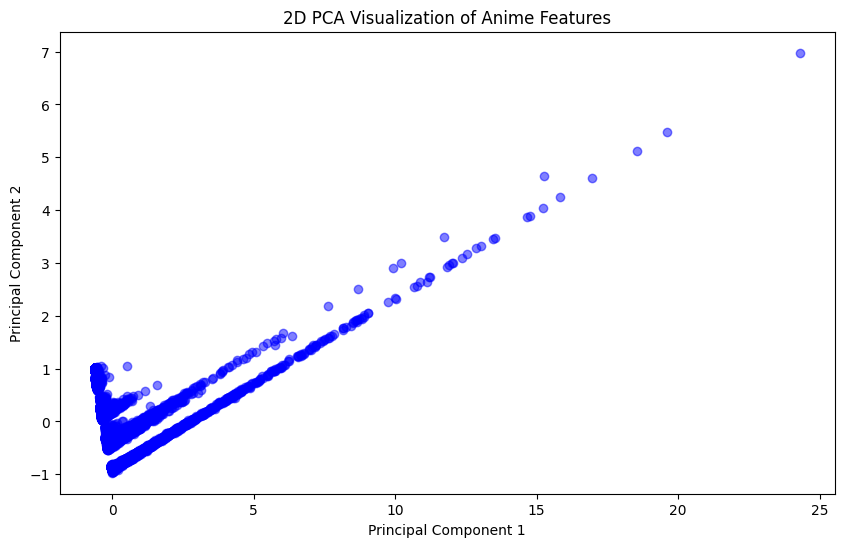

In [31]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions to 2D
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Plot the transformed data
plt.figure(figsize=(10, 6))
plt.scatter(features_2D[:, 0], features_2D[:, 1], alpha=0.5, c='blue')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features")
plt.show()


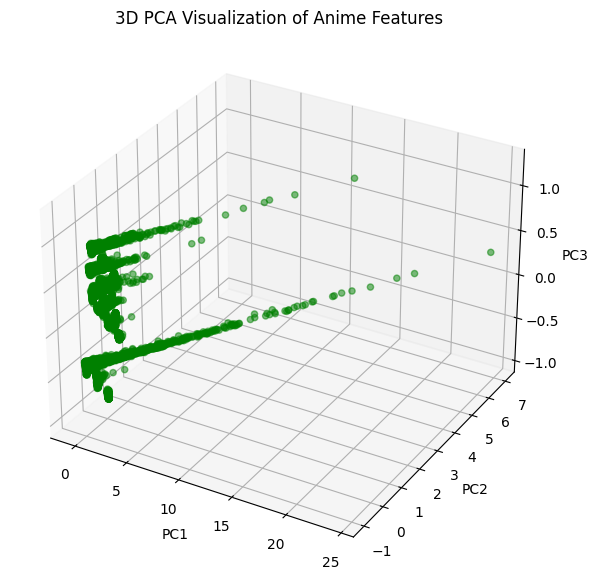

In [32]:
from mpl_toolkits.mplot3d import Axes3D

# Reduce dimensions to 3D
pca_3d = PCA(n_components=3)
features_3D = pca_3d.fit_transform(features_combined)

# 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(features_3D[:, 0], features_3D[:, 1], features_3D[:, 2], alpha=0.5, c='green')

ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("3D PCA Visualization of Anime Features")
plt.show()


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


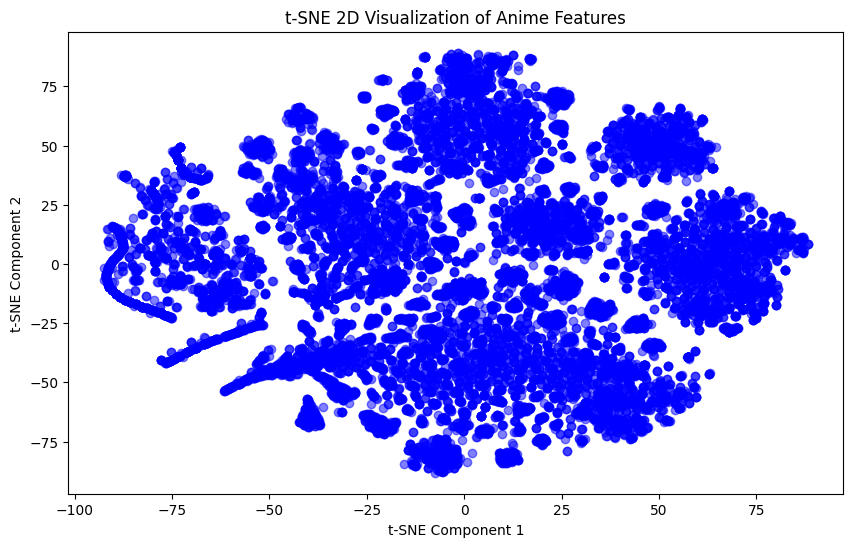

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Reduce dimensions to 2D
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
features_2D = tsne.fit_transform(features_combined)

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(features_2D[:, 0], features_2D[:, 1], alpha=0.5, c='blue')
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.title("t-SNE 2D Visualization of Anime Features")
plt.show()


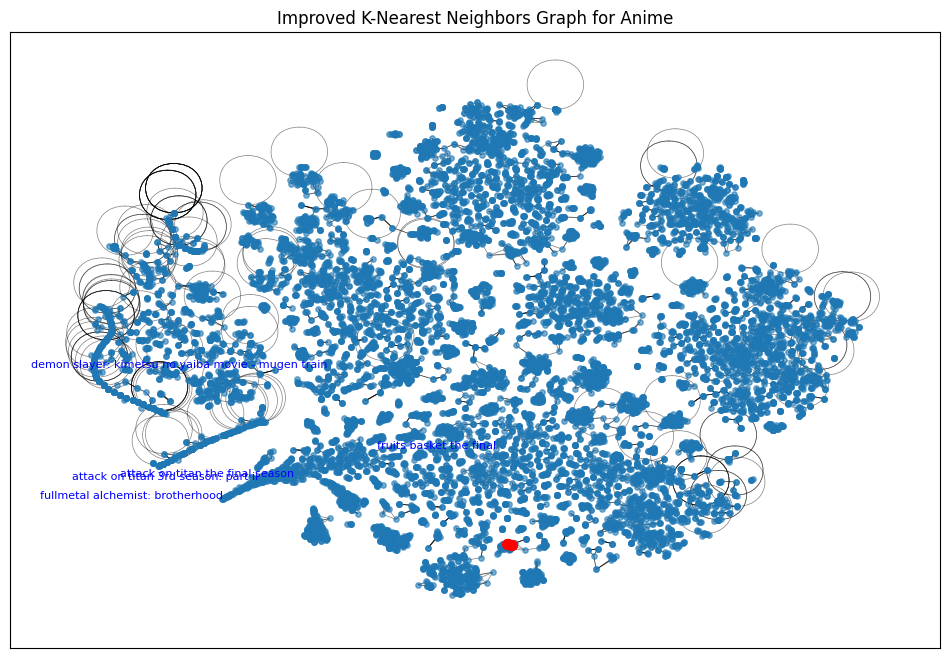

In [34]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import NearestNeighbors

# Fit kNN model
knn = NearestNeighbors(n_neighbors=5, metric="euclidean")
knn.fit(features_2D)

# Get nearest neighbors
distances, indices = knn.kneighbors(features_2D)

# Create a graph
G = nx.Graph()
for i in range(features_2D.shape[0]):
    for j in range(1, 5):  # Connect each point to its 4 nearest neighbors
        G.add_edge(i, indices[i][j], weight=distances[i][j])

# Plot graph
plt.figure(figsize=(12, 8))

# Get positions for graph layout
pos = {i: features_2D[i] for i in range(features_2D.shape[0])}

# Draw nodes (smaller, transparent)
nx.draw_networkx_nodes(G, pos, node_size=15, alpha=0.6)

# Draw edges (lighter, thinner)
nx.draw_networkx_edges(G, pos, edge_color='black', alpha=0.5, width=0.5)

# Highlight a specific anime and its neighbors
anime_index = np.random.randint(0, features_2D.shape[0])  # Choose a random anime
highlight_nodes = [anime_index] + list(indices[anime_index, 1:5])

nx.draw_networkx_nodes(G, pos, nodelist=highlight_nodes, node_color='red', node_size=50)
nx.draw_networkx_edges(G, pos, edgelist=[(anime_index, n) for n in indices[anime_index, 1:5]], edge_color='red', width=1.5)

# Label only a few top-rated animes# Ensure 'Rating Score' is numeric
df['Rating Score'] = pd.to_numeric(df['Rating Score'], errors='coerce')

# Label only a few top-rated animes (after fixing dtype)
for i in df.nlargest(5, 'Rating Score').index:
    plt.text(features_2D[i, 0], features_2D[i, 1], df.loc[i, 'Name'], fontsize=8, ha='right', color='blue')


plt.title("Improved K-Nearest Neighbors Graph for Anime")
plt.show()


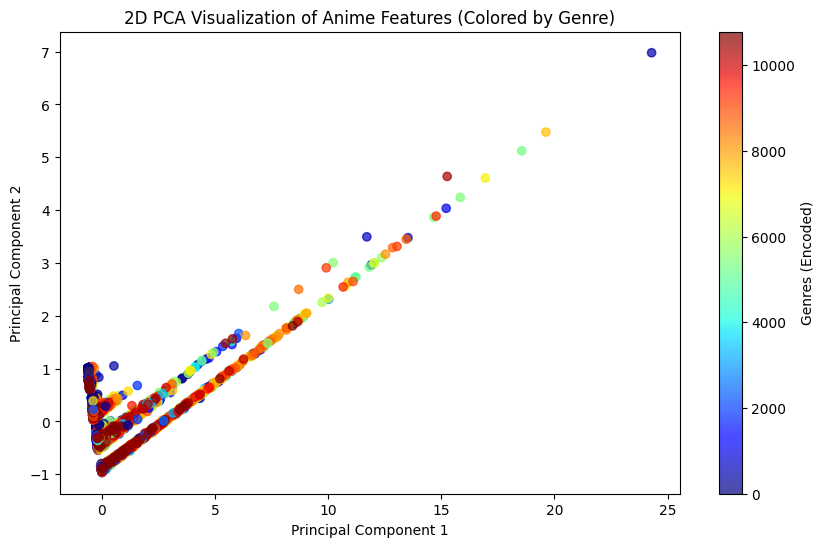

In [35]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# Reduce dimensions to 2D using PCA
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Assign colors based on genres (Tags)
unique_tags = df['Tags'].unique()
color_map = {tag: i for i, tag in enumerate(unique_tags)}  # Assigning unique colors to each tag
colors = [color_map[tag] if tag in color_map else 0 for tag in df['Tags']]  # Map colors to anime

# Scatter plot with color mapping
plt.figure(figsize=(10, 6))
plt.scatter(features_2D[:, 0], features_2D[:, 1], c=colors, cmap='jet', alpha=0.7)
plt.colorbar(label="Genres (Encoded)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features (Colored by Genre)")
plt.show()



🔹 **Genre Encoding (Tag → Encoded Value)**
Comedy, Drama, Shounen, Sports, Tennis, Based on a Manga: 0
Drama, Mecha, Sci Fi, Conspiracy, Kaijuu, Loneliness, Melancholy, Military, Monsters, Post-apocalyptic, Psychological, Super Robot, Original Work: 1
Action, Comedy, Mecha, Sci Fi, Shounen, Military, Real Robot, Tsundere, Based on a Light Novel: 2
Idols, School Life, CG Animation: 3
Family Friendly: 4
Unknown: 5
Dancing: 6
Action, Adventure, Fantasy, Chinese Animation, Martial Arts, Short Episodes, Xianxia, Based on a Novel: 7
Animal Protagonists, Anthropomorphic, Non-Human Protagonists, Rabbits: 8
Animal Protagonists, Anthropomorphic, Birds, Commercials, Demons, Hell, Non-Human Protagonists, Promotional, Short Episodes: 9
Action, Comedy, Drama, Ecchi, Sci Fi, Shounen, Sports, Based on a Manga: 10
Comedy, Animal Protagonists, Anthropomorphic, Music, Non-Human Protagonists, Rock Music, Sanrio Characters, Short Episodes, Original Work: 11
Vocaloid: 12
Horror, Supernatural, Based on a No

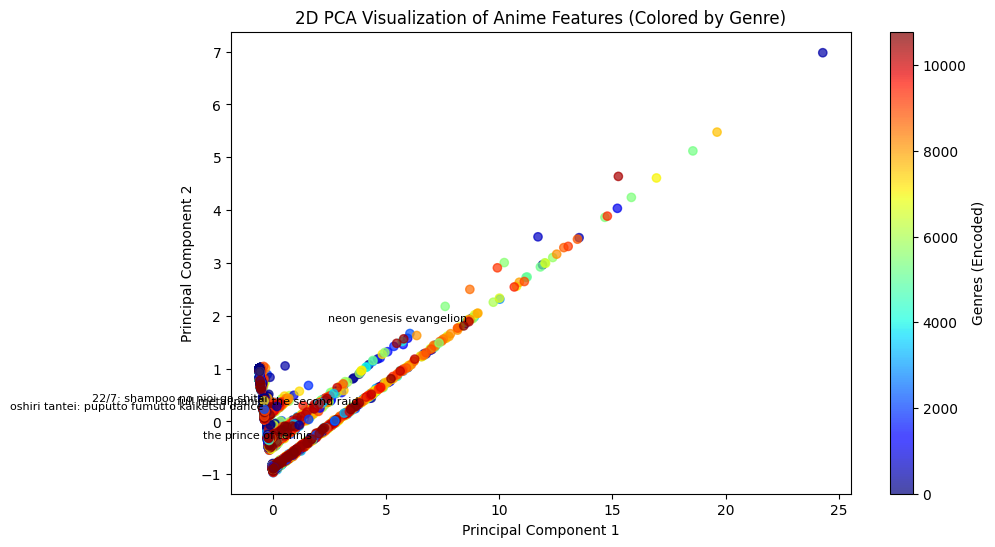

In [36]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np

# Reduce dimensions to 2D using PCA
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Assign colors based on genres (Tags)
unique_tags = df['Tags'].unique()
color_map = {tag: i for i, tag in enumerate(unique_tags)}  # Assigning unique colors to each tag
colors = [color_map[tag] if tag in color_map else 0 for tag in df['Tags']]  # Map colors to anime

# Print encoding values in terminal
print("\n🔹 **Genre Encoding (Tag → Encoded Value)**")
for tag, value in color_map.items():
    print(f"{tag}: {value}")

# Scatter plot with color mapping
plt.figure(figsize=(10, 6))
scatter = plt.scatter(features_2D[:, 0], features_2D[:, 1], c=colors, cmap='jet', alpha=0.7)
plt.colorbar(label="Genres (Encoded)")

# Label first 5 animes as an example
for i in range(5):
    plt.text(features_2D[i, 0], features_2D[i, 1], df.loc[i, 'Name'], fontsize=8, ha='right', color='black')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features (Colored by Genre)")
plt.show()



🔹 **Genre Encoding (Tag → Encoded Value)**
15th Century: 0
16th Century: 1
17th Century: 2
18th Century: 3
19th Century: 4
Abstract: 5
Acting: 6
Action: 7
Adult Couples: 8
Adult Industry: 9
Adventure: 10
Africa: 11
Afterlife: 12
Age Gap: 13
Age Transformation: 14
Aging: 15
Agriculture: 16
Alcohol: 17
Alice in Wonderland: 18
Aliens: 19
All-Boys School: 20
All-Girls School: 21
America: 22
Amnesia: 23
Amusement Park: 24
Ancient China: 25
Androids: 26
Androphobia: 27
Angels: 28
Animal Characteristics: 29
Animal Protagonists: 30
Animal Transformation: 31
Anime Bancho: 32
Anime Industry: 33
Anime Tamago: 34
Anime no Chikara: 35
Anime no Me: 36
Animeism: 37
Anthropomorphic: 38
Apartment Life: 39
Apocalypse: 40
Apprenticeship: 41
Archery: 42
Arranged Marriage: 43
Art: 44
Art School: 45
Assassins: 46
Astronauts: 47
Astronomy: 48
Australia: 49
Autobiographies: 50
Aviation: 51
BDSM: 52
BL: 53
Badminton: 54
Baking: 55
Ballet Dancing: 56
Bar: 57
Baseball: 58
Based on a 4-Koma Manga: 59
Based on a 

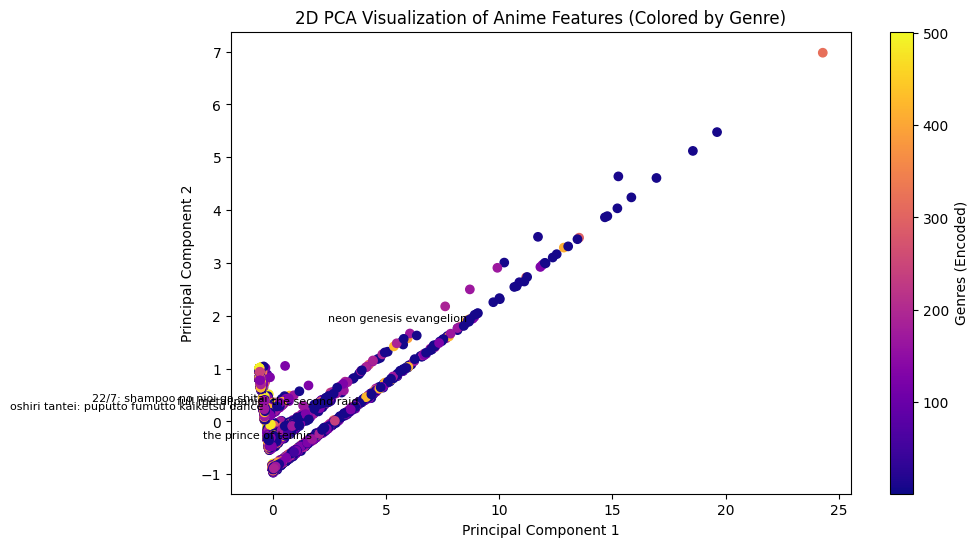

In [37]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Step 1: Split multi-genre tags
df['Tags'] = df['Tags'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])  # Convert comma-separated tags into lists

# Step 2: Flatten the tag list to create a unique mapping
all_tags = sorted(set(tag for tags in df['Tags'] for tag in tags))  # Get all unique genres
color_map = {tag: i for i, tag in enumerate(all_tags)}  # Assign unique colors

# Step 3: Assign a single genre per anime (choose first genre for simplicity)
df['Primary_Tag'] = df['Tags'].apply(lambda x: x[0] if x else 'Unknown')

# Step 4: Map colors to primary genres
colors = [color_map[tag] if tag in color_map else 0 for tag in df['Primary_Tag']]

# Step 5: Print genre encoding in terminal
print("\n🔹 **Genre Encoding (Tag → Encoded Value)**")
for tag, value in color_map.items():
    print(f"{tag}: {value}")

# Step 6: Perform PCA
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Step 7: Scatter plot with color mapping
plt.figure(figsize=(10, 6))
scatter = plt.scatter(features_2D[:, 0], features_2D[:, 1], c=colors, cmap='plasma')
plt.colorbar(label="Genres (Encoded)")

# Step 8: Label first 5 animes as an example
for i in range(5):
    plt.text(features_2D[i, 0], features_2D[i, 1], df.loc[i, 'Name'], fontsize=8, ha='right', color='black')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features (Colored by Genre)")
plt.show()



🔹 **Genre Encoding (Tag → Encoded Value)**


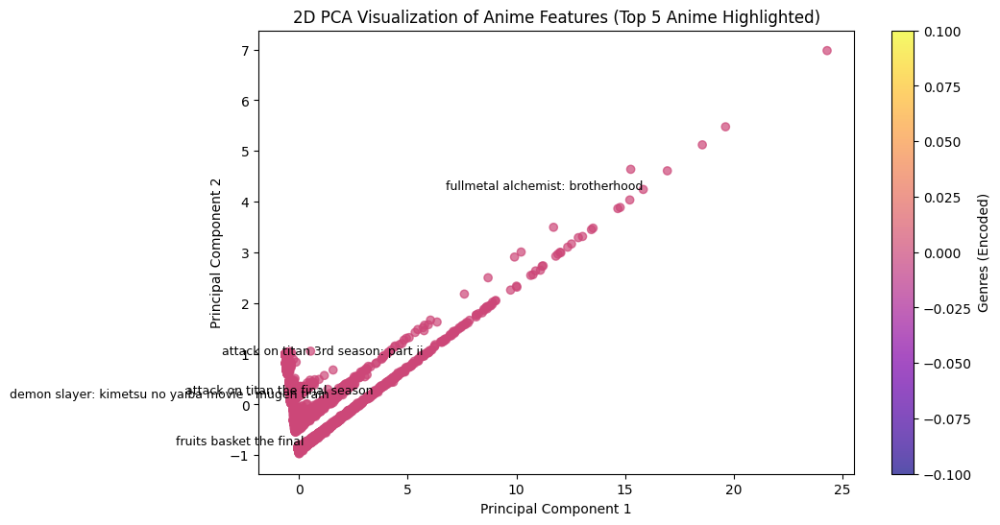

In [38]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Step 1: Split multi-genre tags
df['Tags'] = df['Tags'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])  # Convert comma-separated tags into lists

# Step 2: Flatten the tag list to create a unique mapping
all_tags = sorted(set(tag for tags in df['Tags'] for tag in tags))  # Get all unique genres
color_map = {tag: i for i, tag in enumerate(all_tags)}  # Assign unique colors

# Step 3: Assign a single genre per anime (choose first genre for simplicity)
df['Primary_Tag'] = df['Tags'].apply(lambda x: x[0] if x else 'Unknown')

# Step 4: Map colors to primary genres
colors = [color_map[tag] if tag in color_map else 0 for tag in df['Primary_Tag']]

# Step 5: Print genre encoding in terminal
print("\n🔹 **Genre Encoding (Tag → Encoded Value)**")
for tag, value in color_map.items():
    print(f"{tag}: {value}")

# Step 6: Perform PCA
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Step 7: Scatter plot with color mapping
plt.figure(figsize=(10, 6))
scatter = plt.scatter(features_2D[:, 0], features_2D[:, 1], c=colors, cmap='plasma', alpha=0.7)
plt.colorbar(label="Genres (Encoded)")

# Step 8: Label top 5 highest-rated anime
top_5_anime = df.nlargest(5, 'Rating Score')
for i in top_5_anime.index:
    plt.text(features_2D[i, 0], features_2D[i, 1], df.loc[i, 'Name'], fontsize=9, ha='right', color='black')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features (Top 5 Anime Highlighted)")
plt.show()



🔹 **Genre Encoding (Tag → Encoded Value)**

🔹 **Principal Component 1 (PC1) Values:**
[ 1.71450818  8.59677564  3.79115813 ... -0.57030142 -0.34524117
 -0.38074002]

🔹 **Principal Component 2 (PC2) Values:**
[-0.32738437  1.9032492   0.32385008 ...  0.77904617  0.19408019
  0.23007432]


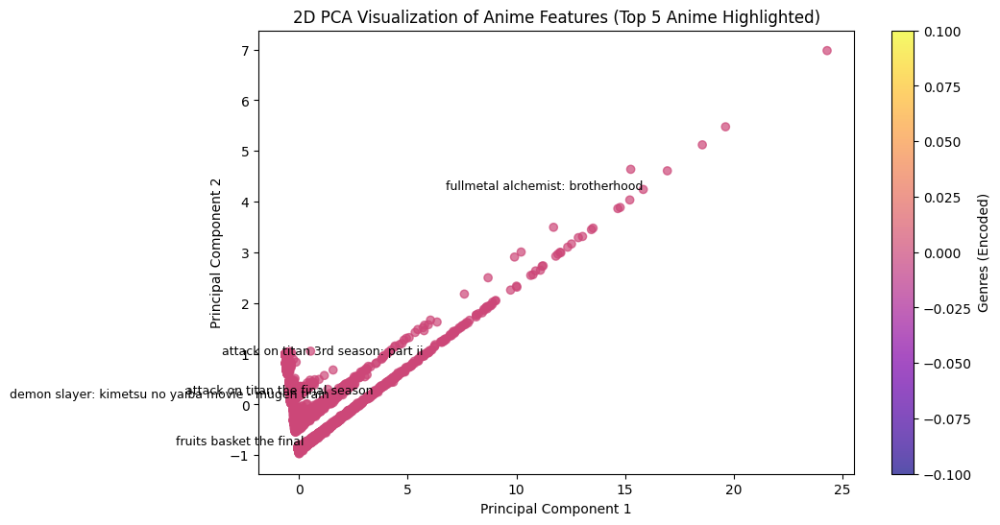

In [39]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Step 1: Split multi-genre tags
df['Tags'] = df['Tags'].apply(lambda x: x.split(', ') if isinstance(x, str) else [])  # Convert comma-separated tags into lists

# Step 2: Flatten the tag list to create a unique mapping
all_tags = sorted(set(tag for tags in df['Tags'] for tag in tags))  # Get all unique genres
color_map = {tag: i for i, tag in enumerate(all_tags)}  # Assign unique colors

# Step 3: Assign a single genre per anime (choose first genre for simplicity)
df['Primary_Tag'] = df['Tags'].apply(lambda x: x[0] if x else 'Unknown')

# Step 4: Map colors to primary genres
colors = [color_map[tag] if tag in color_map else 0 for tag in df['Primary_Tag']]

# Step 5: Print genre encoding in terminal
print("\n🔹 **Genre Encoding (Tag → Encoded Value)**")
for tag, value in color_map.items():
    print(f"{tag}: {value}")

# Step 6: Perform PCA
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Extract PC1 and PC2
PC1 = features_2D[:, 0]  # First principal component
PC2 = features_2D[:, 1]  # Second principal component

# Print PC1 and PC2 values in terminal
print("\n🔹 **Principal Component 1 (PC1) Values:**")
print(PC1)

print("\n🔹 **Principal Component 2 (PC2) Values:**")
print(PC2)

# Step 7: Scatter plot with color mapping
plt.figure(figsize=(10, 6))
scatter = plt.scatter(PC1, PC2, c=colors, cmap='plasma', alpha=0.7)
plt.colorbar(label="Genres (Encoded)")

# Step 8: Label top 5 highest-rated anime
top_5_anime = df.nlargest(5, 'Rating Score')
for i in top_5_anime.index:
    plt.text(PC1[i], PC2[i], df.loc[i, 'Name'], fontsize=9, ha='right', color='black')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features (Top 5 Anime Highlighted)")
plt.show()


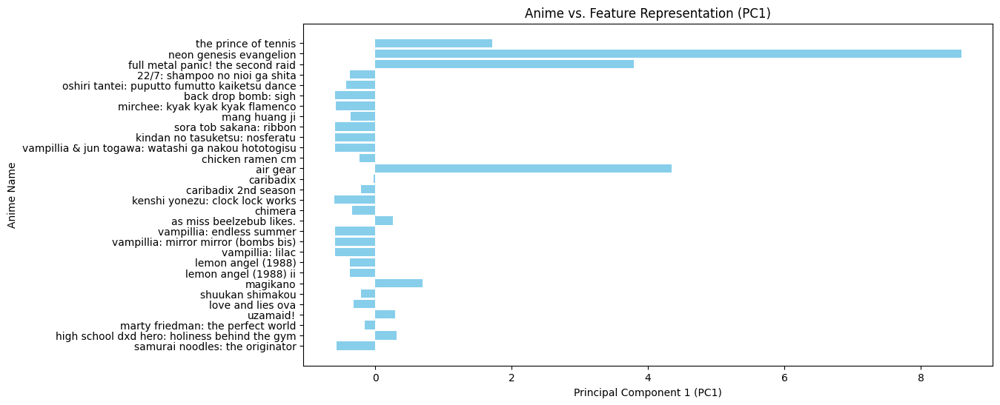

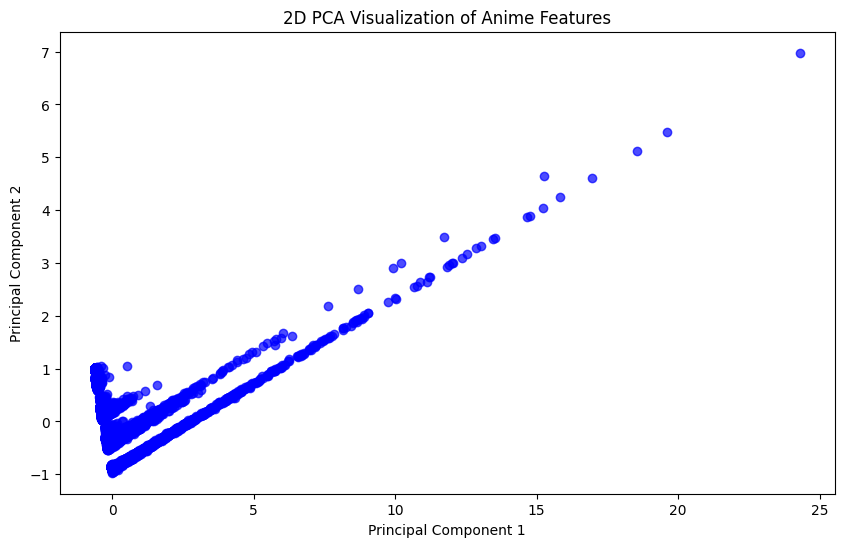

In [40]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import numpy as np
import pandas as pd

# Perform PCA to reduce dimensions to 2D
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Extract Principal Components
PC1 = features_2D[:, 0]  # First Principal Component
PC2 = features_2D[:, 1]  # Second Principal Component

# Get anime names
anime_names = df["Name"].values

# Plot Anime Name vs. PC1
plt.figure(figsize=(12, 6))
plt.barh(anime_names[:30], PC1[:30], color='skyblue')  # Plot first 30 anime for clarity
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Anime Name")
plt.title("Anime vs. Feature Representation (PC1)")
plt.gca().invert_yaxis()  # Invert for readability
plt.show()

# Scatter Plot of PC1 vs. PC2
plt.figure(figsize=(10, 6))
plt.scatter(PC1, PC2, alpha=0.7, c='blue')
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features")
plt.show()


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


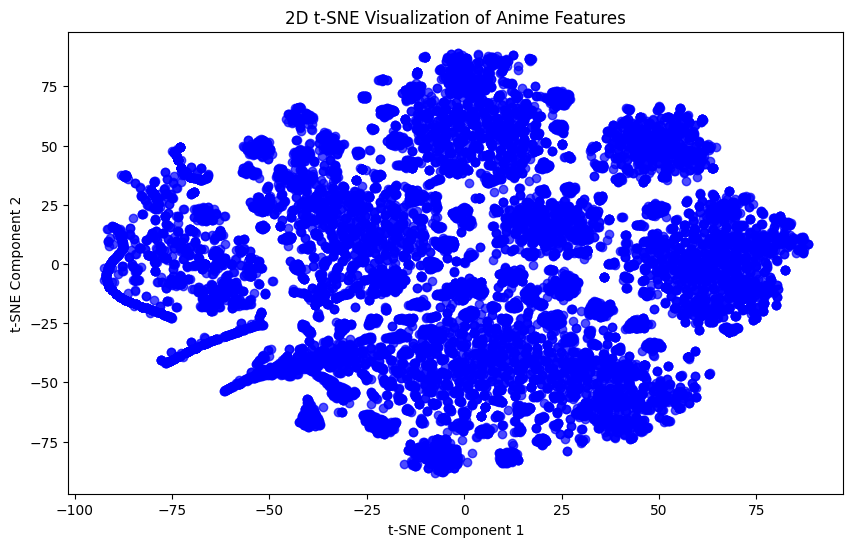

In [41]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# Reduce dimensions to 2D using t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
features_2D = tsne.fit_transform(features_combined)

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(features_2D[:, 0], features_2D[:, 1], alpha=0.7, c='blue')
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.title("2D t-SNE Visualization of Anime Features")
plt.show()


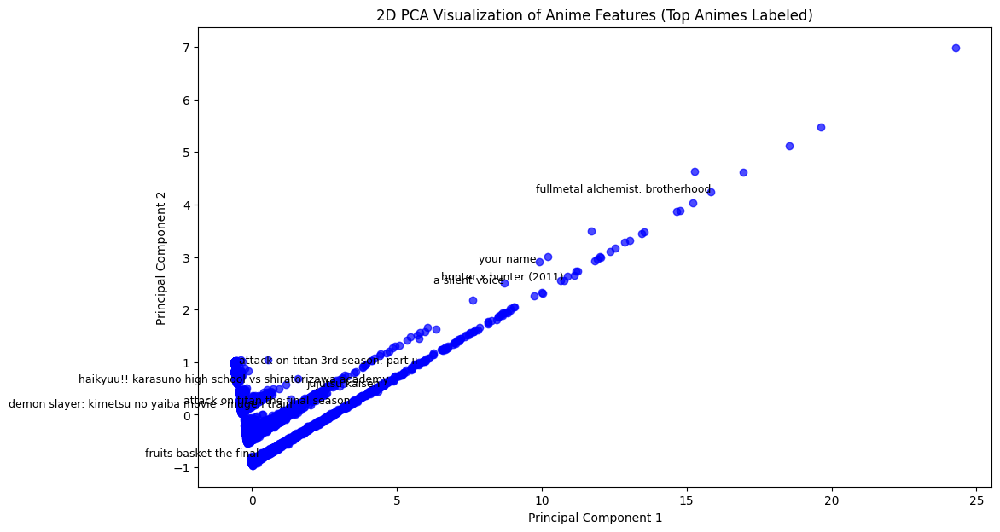

In [42]:
import matplotlib.pyplot as plt

# Reduce dimensions to 2D using PCA
pca = PCA(n_components=2)
features_2D = pca.fit_transform(features_combined)

# Define important animes (Top 10 by rating)
top_anime = df.nlargest(10, 'Rating Score')

# Scatter plot
plt.figure(figsize=(12, 7))
plt.scatter(features_2D[:, 0], features_2D[:, 1], alpha=0.7, c='blue')

# Label top animes
for i, row in top_anime.iterrows():
    plt.text(features_2D[i, 0], features_2D[i, 1], row['Name'], fontsize=9, ha='right')

plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D PCA Visualization of Anime Features (Top Animes Labeled)")
plt.show()


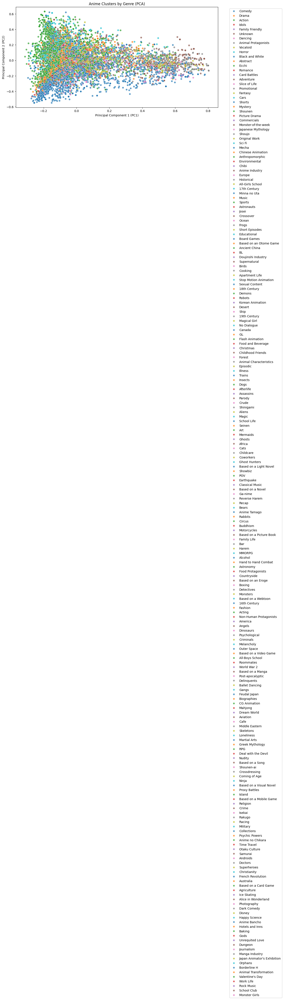

[[-5.73774289e-04 -7.20006254e-04 -1.00763258e-04 ... -5.37967473e-04
   3.26368433e-05  1.86611290e-03]
 [-1.78510573e-04 -3.31538274e-04 -1.77676159e-04 ... -5.32564629e-04
   7.93399966e-04 -7.07598266e-04]]


In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer

# Load the dataset
df = pd.read_csv("..\\anime.csv")

# Fill NaN values
df['Tags'] = df['Tags'].fillna('')

# TF-IDF Vectorization for Tags
tag_vectorizer = TfidfVectorizer(stop_words='english', max_features=600)
tag_matrix = tag_vectorizer.fit_transform(df['Tags']).toarray()

# PCA to reduce features to 2D space
pca = PCA(n_components=2)
pca_features = pca.fit_transform(tag_matrix)

# Convert PCA output to DataFrame
df_pca = pd.DataFrame(pca_features, columns=['PC1', 'PC2'])
df_pca['Anime Name'] = df['Name']
df_pca['Genre'] = df['Tags'].apply(lambda x: x.split(',')[0])  # Take the first genre tag

# Plot the clusters
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_pca, x='PC1', y='PC2', hue='Genre', palette='tab10', alpha=0.7)
plt.title("Anime Clusters by Genre (PCA)")
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Principal Component 2 (PC2)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
# After fitting the PCA:
loadings = pca.components_
print(loadings)


In [44]:
from sklearn.neighbors import NearestNeighbors

# Define KNN model
knn = NearestNeighbors(n_neighbors=12, metric='cosine')  # 6 includes Naruto itself
knn.fit(tag_matrix)

# Find Naruto's index
anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]

# Get Naruto's nearest neighbors
distances, indices = knn.kneighbors(tag_matrix[anime1].reshape(1, -1))

# Print the top 5 most similar anime
print("Top 5 Anime Similar to Naruto:")
for i in indices[0][1:]:
    print(df.iloc[i]['Name'])


Top 5 Anime Similar to Naruto:
Naruto Movie 2: Legend of the Stone of Gelel
Naruto Movie 1: Ninja Clash in the Land of Snow
Naruto Special 2: Battle at Hidden Falls. I am the Hero!
Naruto Movie 3: Guardians of the Crescent Moon Kingdom
Boruto: Naruto the Movie
Naruto: Narutimate Hero 3 OVA
Naruto Shippuden Movie 2: Bonds
Naruto Shippuden Movie 1
Boruto: Jump Festa 2016 Special
Boruto: Naruto Next Generations
Naruto: Honoo no Chuunin Shiken! Naruto vs Konohamaru!!


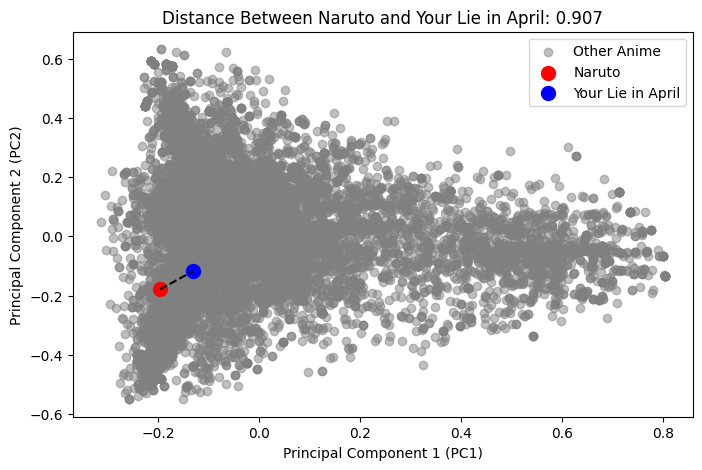

In [45]:
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_distances
import matplotlib.pyplot as plt

# Apply PCA to reduce tag features to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(tag_matrix)

# Get indices of Naruto and Your Lie in April
anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]
ylia_index = df[df["Name"].str.contains("Your Lie in April", case=False, na=False)].index[0]

# Compute distance using cosine similarity
distance = cosine_distances([tag_matrix[anime1]], [tag_matrix[ylia_index]])[0][0]

# Plot their placement on PCA space
plt.figure(figsize=(8, 5))
plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.5, label="Other Anime", color="gray")
plt.scatter(pca_features[anime1, 0], pca_features[anime1, 1], color='red', label="Naruto", s=100)
plt.scatter(pca_features[ylia_index, 0], pca_features[ylia_index, 1], color='blue', label="Your Lie in April", s=100)

# Draw line between them
plt.plot([pca_features[anime1, 0], pca_features[ylia_index, 0]], 
         [pca_features[anime1, 1], pca_features[ylia_index, 1]], 
         color='black', linestyle="dashed", linewidth=1.5)

# Labels & title
plt.title(f"Distance Between Naruto and Your Lie in April: {distance:.3f}")
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Principal Component 2 (PC2)")
plt.legend()
plt.show()


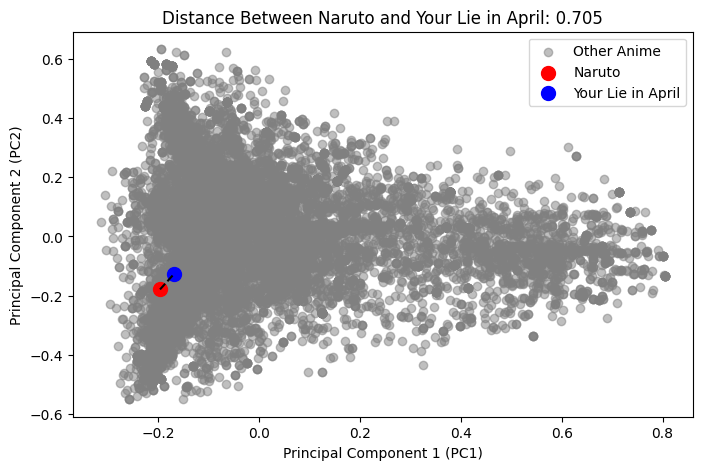

In [46]:
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_distances
import matplotlib.pyplot as plt

# Apply PCA to reduce tag features to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(tag_matrix)

# Get indices of Naruto and Your Lie in April
anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]
ylia_index = df[df["Name"].str.contains("bleach", case=False, na=False)].index[0]

# Compute distance using cosine similarity
distance = cosine_distances([tag_matrix[anime1]], [tag_matrix[ylia_index]])[0][0]

# Plot their placement on PCA space
plt.figure(figsize=(8, 5))
plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.5, label="Other Anime", color="gray")
plt.scatter(pca_features[anime1, 0], pca_features[anime1, 1], color='red', label="Naruto", s=100)
plt.scatter(pca_features[ylia_index, 0], pca_features[ylia_index, 1], color='blue', label="Your Lie in April", s=100)

# Draw line between them
plt.plot([pca_features[anime1, 0], pca_features[ylia_index, 0]], 
         [pca_features[anime1, 1], pca_features[ylia_index, 1]], 
         color='black', linestyle="dashed", linewidth=1.5)

# Labels & title
plt.title(f"Distance Between Naruto and Your Lie in April: {distance:.3f}")
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Principal Component 2 (PC2)")
plt.legend()
plt.show()



🔹 Cosine Distances from Naruto to Bottom 10 Anime:
Platinum End: 0.896
Shima Shima Tora no Shimajirou no Shouboutai: 1.000
Ninja Box 3rd Season: 0.492
Her: 1.000
Beginning: 1.000
Aria the Crepuscolo: 0.784
Chuck Shimezou: 1.000
Captain Bal: 1.000
Restaurant to Another World 2: 0.973
Ekubo Ouji: 1.000


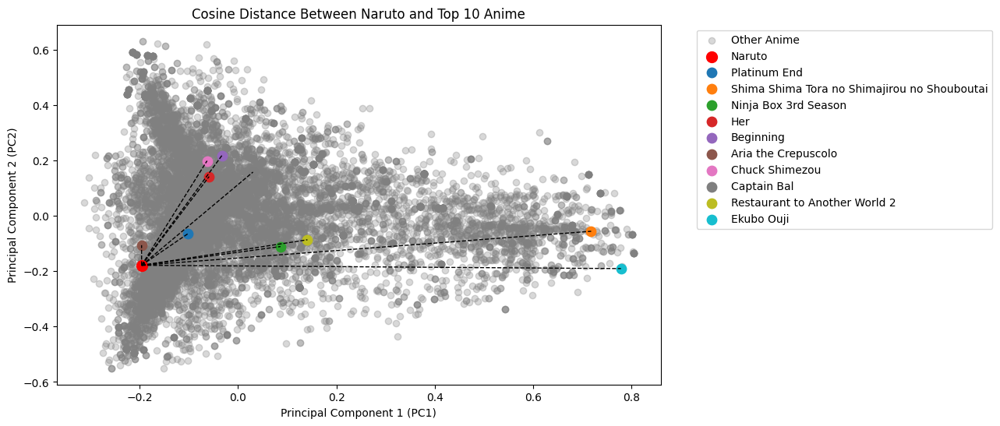

In [47]:
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_distances
import matplotlib.pyplot as plt
import pandas as pd

# ✅ Sort anime by Rating Score (descending order)
top_10_anime = df.sort_values(by="Rating Score", ascending=False).head(10)

# ✅ Apply PCA to reduce tag features to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(tag_matrix)

# ✅ Get index of Naruto
anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]

# ✅ Compute distances between Naruto and each of the top 10 anime
distances = {}
for anime_name in top_10_anime["Name"]:
    anime_index = df[df["Name"] == anime_name].index[0]
    dist = cosine_distances([tag_matrix[anime1]], [tag_matrix[anime_index]])[0][0]
    distances[anime_name] = dist

# ✅ Print distances
print("\n🔹 Cosine Distances from Naruto to Bottom 10 Anime:")
for anime, dist in distances.items():
    print(f"{anime}: {dist:.3f}")

# ✅ Plot Naruto and the top 10 anime
plt.figure(figsize=(10, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.3, label="Other Anime", color="gray")

# ✅ Highlight Naruto
plt.scatter(pca_features[anime1, 0], pca_features[anime1, 1], color='red', label="Naruto", s=100)

# ✅ Highlight top 10 anime
for anime_name in top_10_anime["Name"]:
    anime_index = df[df["Name"] == anime_name].index[0]
    plt.scatter(pca_features[anime_index, 0], pca_features[anime_index, 1], label=anime_name, s=80)

    # ✅ Draw dashed line from Naruto to each top anime
    plt.plot([pca_features[anime1, 0], pca_features[anime_index, 0]], 
             [pca_features[anime1, 1], pca_features[anime_index, 1]], 
             color='black', linestyle="dashed", linewidth=1)

# ✅ Labels & title
plt.title("Cosine Distance Between Naruto and Top 10 Anime")
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Principal Component 2 (PC2)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



🔹 Cosine Distances from Naruto to Top 10 Anime:
Hunter x Hunter (2011): 0.667
Jujutsu Kaisen: 0.738
Attack on Titan The Final Season: 0.752
Gintama Kanketsu-hen: Yorozuya yo Eien Nare: 0.799
Fullmetal Alchemist: Brotherhood: 0.803
Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train: 0.805
Demon Slayer: Kimetsu no Yaiba: 0.826
Attack on Titan 3rd Season: Part II: 0.833
Gintama (2015): 0.846
Mob Psycho 100 II: 0.864


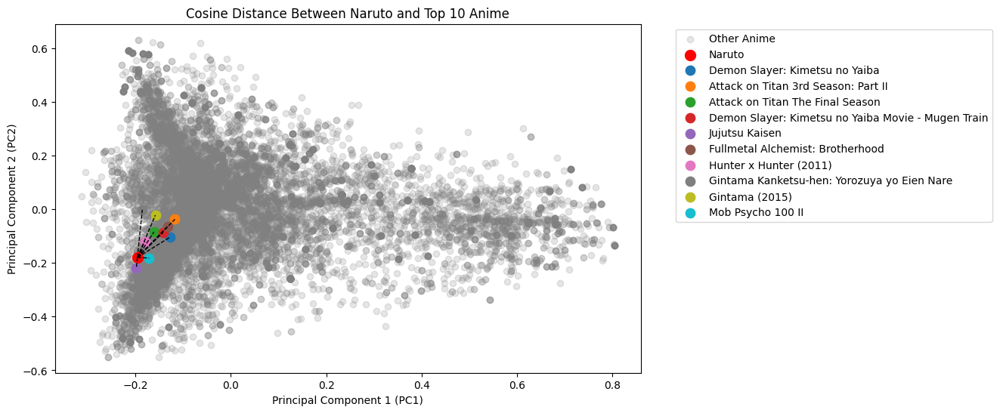

In [48]:
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_distances
import matplotlib.pyplot as plt
import pandas as pd

# ✅ Define the top 10 anime manually
top_10_anime_names = [
    "Fullmetal Alchemist: Brotherhood",
    "Attack on Titan The Final Season",
    "Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train",
    "Attack on Titan 3rd Season: Part II",
    "Jujutsu Kaisen",
    "Hunter x Hunter (2011)",
    "Demon Slayer: Kimetsu no Yaiba",
    "Gintama Kanketsu-hen: Yorozuya yo Eien Nare",
    "Gintama (2015)",
    "Mob Psycho 100 II"
]

# ✅ Filter dataset for these anime
top_10_anime = df[df["Name"].isin(top_10_anime_names)]

# ✅ Apply PCA to reduce tag features to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(tag_matrix)

# ✅ Get Naruto's index
anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]

# ✅ Compute cosine distances from Naruto to each top 10 anime
distances = {}
for anime_name in top_10_anime["Name"]:
    anime_index = df[df["Name"] == anime_name].index[0]
    dist = cosine_distances([tag_matrix[anime1]], [tag_matrix[anime_index]])[0][0]
    distances[anime_name] = dist

# ✅ Print sorted distances
print("\n🔹 Cosine Distances from Naruto to Top 10 Anime:")
for anime, dist in sorted(distances.items(), key=lambda x: x[1]):
    print(f"{anime}: {dist:.3f}")

# ✅ Plot Naruto and the top 10 anime in PCA space
plt.figure(figsize=(10, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.2, label="Other Anime", color="gray")

# ✅ Highlight Naruto
plt.scatter(pca_features[anime1, 0], pca_features[anime1, 1], color='red', label="Naruto", s=100)

# ✅ Highlight each of the top 10 anime
for anime_name in top_10_anime["Name"]:
    anime_index = df[df["Name"] == anime_name].index[0]
    plt.scatter(pca_features[anime_index, 0], pca_features[anime_index, 1], label=anime_name, s=80)

    # ✅ Draw dashed lines from Naruto to each anime
    plt.plot([pca_features[anime1, 0], pca_features[anime_index, 0]], 
             [pca_features[anime1, 1], pca_features[anime_index, 1]], 
             color='black', linestyle="dashed", linewidth=1)

# ✅ Labels & title
plt.title("Cosine Distance Between Naruto and Top 10 Anime")
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Principal Component 2 (PC2)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



🔹 Cosine Distances from Naruto to Top 10 Anime:
Hunter x Hunter (2011): 0.667
Jujutsu Kaisen: 0.738
Attack on Titan The Final Season: 0.752
Gintama Kanketsu-hen: Yorozuya yo Eien Nare: 0.799
Fullmetal Alchemist: Brotherhood: 0.803
Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train: 0.805
Demon Slayer: Kimetsu no Yaiba: 0.826
Attack on Titan 3rd Season: Part II: 0.833
Gintama (2015): 0.846
Mob Psycho 100 II: 0.864


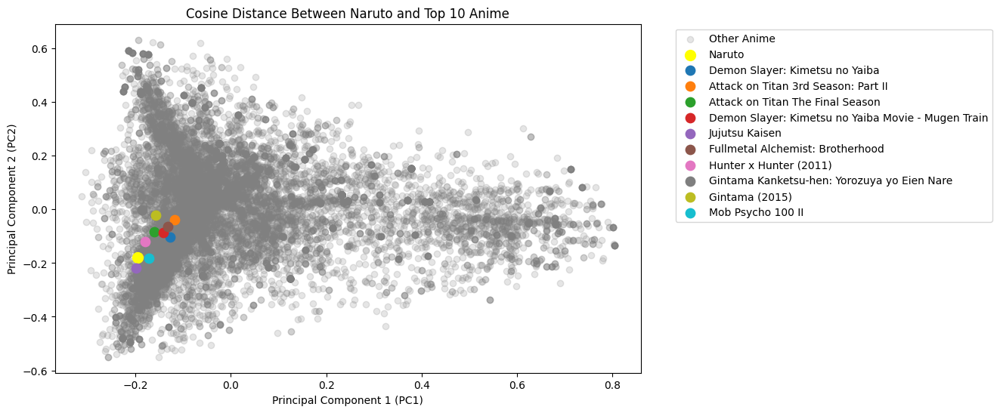

In [49]:
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_distances
import matplotlib.pyplot as plt
import pandas as pd

# ✅ Define the top 10 anime manually
top_10_anime_names = [
    "Fullmetal Alchemist: Brotherhood",
    "Attack on Titan The Final Season",
    "Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train",
    "Attack on Titan 3rd Season: Part II",
    "Jujutsu Kaisen",
    "Hunter x Hunter (2011)",
    "Demon Slayer: Kimetsu no Yaiba",
    "Gintama Kanketsu-hen: Yorozuya yo Eien Nare",
    "Gintama (2015)",
    "Mob Psycho 100 II"
]

# ✅ Filter dataset for these anime
top_10_anime = df[df["Name"].isin(top_10_anime_names)]

# ✅ Apply PCA to reduce tag features to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(tag_matrix)

# ✅ Get Naruto's index
anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]

# ✅ Compute cosine distances from Naruto to each top 10 anime
distances = {}
for anime_name in top_10_anime["Name"]:
    anime_index = df[df["Name"] == anime_name].index[0]
    dist = cosine_distances([tag_matrix[anime1]], [tag_matrix[anime_index]])[0][0]
    distances[anime_name] = dist

# ✅ Print sorted distances
print("\n🔹 Cosine Distances from Naruto to Top 10 Anime:")
for anime, dist in sorted(distances.items(), key=lambda x: x[1]):
    print(f"{anime}: {dist:.3f}")

# ✅ Plot Naruto and the top 10 anime in PCA space
plt.figure(figsize=(10, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.2, label="Other Anime", color="gray")

# ✅ Highlight Naruto
plt.scatter(pca_features[anime1, 0], pca_features[anime1, 1], color='yellow', label="Naruto", s=100)

# ✅ Highlight each of the top 10 anime
for anime_name in top_10_anime["Name"]:
    anime_index = df[df["Name"] == anime_name].index[0]
    plt.scatter(pca_features[anime_index, 0], pca_features[anime_index, 1], label=anime_name, s=80)

    # ✅ Draw dashed lines from Naruto to each anime
    plt.plot([pca_features[anime1, 0], pca_features[anime_index, 0]], 
             [pca_features[anime1, 1], pca_features[anime_index, 1]], 
             color='black', linestyle="dashed", linewidth=0)

# ✅ Labels & title
plt.title("Cosine Distance Between Naruto and Top 10 Anime")
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Principal Component 2 (PC2)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()



🔹 Cosine Distances from Naruto to Top 10 Anime:
Hunter x Hunter (2011): 0.667
Jujutsu Kaisen: 0.738
Attack on Titan The Final Season: 0.752
Gintama Kanketsu-hen: Yorozuya yo Eien Nare: 0.799
Fullmetal Alchemist: Brotherhood: 0.803
Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train: 0.805
Demon Slayer: Kimetsu no Yaiba: 0.826
Attack on Titan 3rd Season: Part II: 0.833
Gintama (2015): 0.846
Mob Psycho 100 II: 0.864


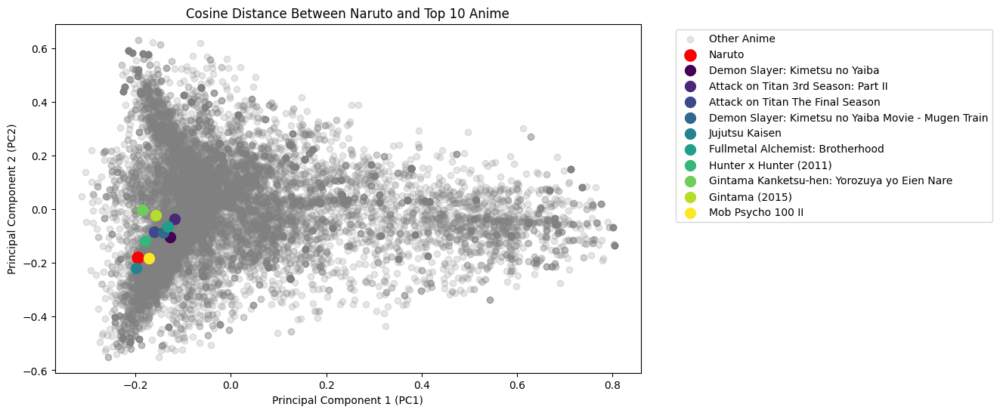

In [50]:
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_distances
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ✅ Define the top 10 anime manually
top_10_anime_names = [
    "Fullmetal Alchemist: Brotherhood",
    "Attack on Titan The Final Season",
    "Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train",
    "Attack on Titan 3rd Season: Part II",
    "Jujutsu Kaisen",
    "Hunter x Hunter (2011)",
    "Demon Slayer: Kimetsu no Yaiba",
    "Gintama Kanketsu-hen: Yorozuya yo Eien Nare",
    "Gintama (2015)",
    "Mob Psycho 100 II"
]

# ✅ Filter dataset for these anime
top_10_anime = df[df["Name"].isin(top_10_anime_names)]

# ✅ Apply PCA to reduce tag features to 2D
pca = PCA(n_components=2)
pca_features = pca.fit_transform(tag_matrix)

# ✅ Get Naruto's index
anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]

# ✅ Compute cosine distances from Naruto to each top 10 anime
distances = {}
for anime_name in top_10_anime["Name"]:
    anime_index = df[df["Name"] == anime_name].index[0]
    dist = cosine_distances([tag_matrix[anime1]], [tag_matrix[anime_index]])[0][0]
    distances[anime_name] = dist

# ✅ Print sorted distances
print("\n🔹 Cosine Distances from Naruto to Top 10 Anime:")
for anime, dist in sorted(distances.items(), key=lambda x: x[1]):
    print(f"{anime}: {dist:.3f}")

# ✅ Assign colors using a colormap (choose 'plasma' or 'viridis')
cmap = plt.get_cmap("viridis")  # Change to "viridis" for a different theme
colors = cmap(np.linspace(0, 1, len(top_10_anime)))

# ✅ Plot Naruto and the top 10 anime in PCA space
plt.figure(figsize=(10, 6))
plt.scatter(pca_features[:, 0], pca_features[:, 1], alpha=0.2, label="Other Anime", color="gray")

# ✅ Highlight Naruto in yellow
plt.scatter(pca_features[anime1, 0], pca_features[anime1, 1], color='red', label="Naruto", s=120)
# plt.scatter(pca_features[anime1, 0], pca_features[anime1, 1], color='red', label="Naruto", s=120, edgecolors="black")

# ✅ Highlight each of the top 10 anime with the color gradient
for i, (anime_name, color) in enumerate(zip(top_10_anime["Name"], colors)):
    anime_index = df[df["Name"] == anime_name].index[0]
    plt.scatter(pca_features[anime_index, 0], pca_features[anime_index, 1], label=anime_name, s=100, color=color)   # plt.scatter(pca_features[anime_index, 0], pca_features[anime_index, 1], label=anime_name, s=100, color=color, edgecolors="black")

    # ✅ Draw dashed lines from Naruto to each anime
    plt.plot([pca_features[anime1, 0], pca_features[anime_index, 0]], 
             [pca_features[anime1, 1], pca_features[anime_index, 1]], 
             color='black', linestyle="dashed", linewidth=0)

# ✅ Labels & title
plt.title("Cosine Distance Between Naruto and Top 10 Anime")
plt.xlabel("Principal Component 1 (PC1)")
plt.ylabel("Principal Component 2 (PC2)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


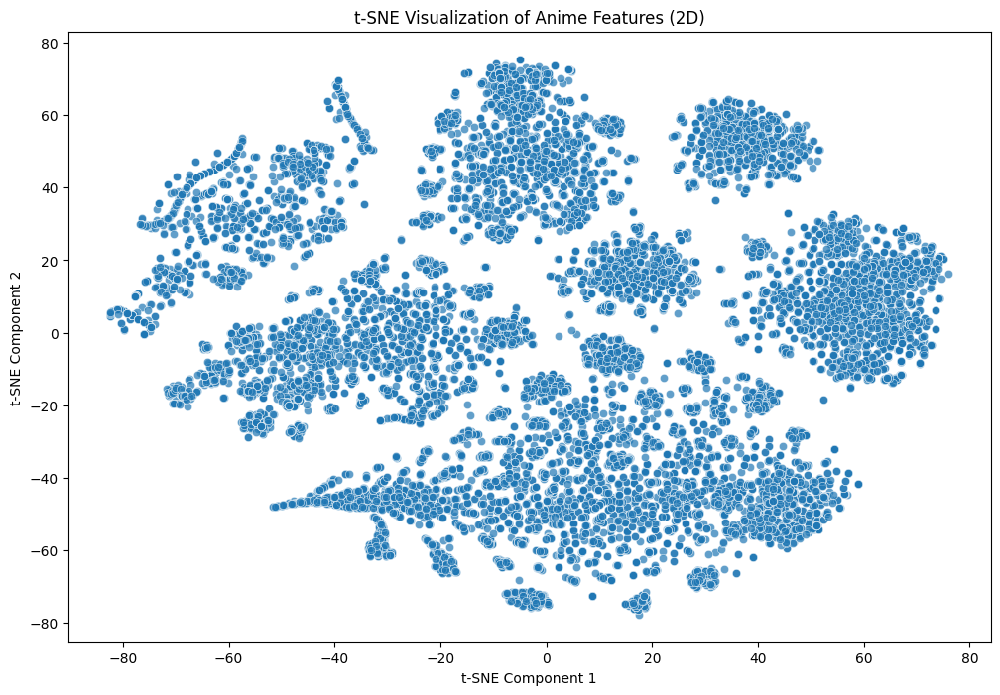

In [57]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import random

# 🔹 Load Preprocessed Feature Matrix
# Assuming 'features_combined' contains the final feature vectors
feature_matrix = features_combined  # Use the matrix you generated
anime_names = df["Name"].values  # Anime titles for labeling

# 🔹 Apply t-SNE (Reduce dimensions to 2D)
tsne = TSNE(n_components=2, perplexity=50, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(feature_matrix)

# 🔹 Convert results into a DataFrame
df_tsne = pd.DataFrame(tsne_results, columns=["TSNE1", "TSNE2"])
df_tsne["anime_name"] = anime_names  # Add anime names

# 🔹 Plot t-SNE results using Seaborn
plt.figure(figsize=(12, 8))
sns.scatterplot(x="TSNE1", y="TSNE2", data=df_tsne, alpha=0.7)

# Optional: Annotate a few random points for better understanding
# for i in random.sample(range(len(df_tsne)), 30):  # Label 30 random points
#     plt.text(df_tsne["TSNE1"][i], df_tsne["TSNE2"][i], df_tsne["anime_name"][i], fontsize=8)

plt.title("t-SNE Visualization of Anime Features (2D)")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()


Feature matrix shape: (16621, 3153)


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


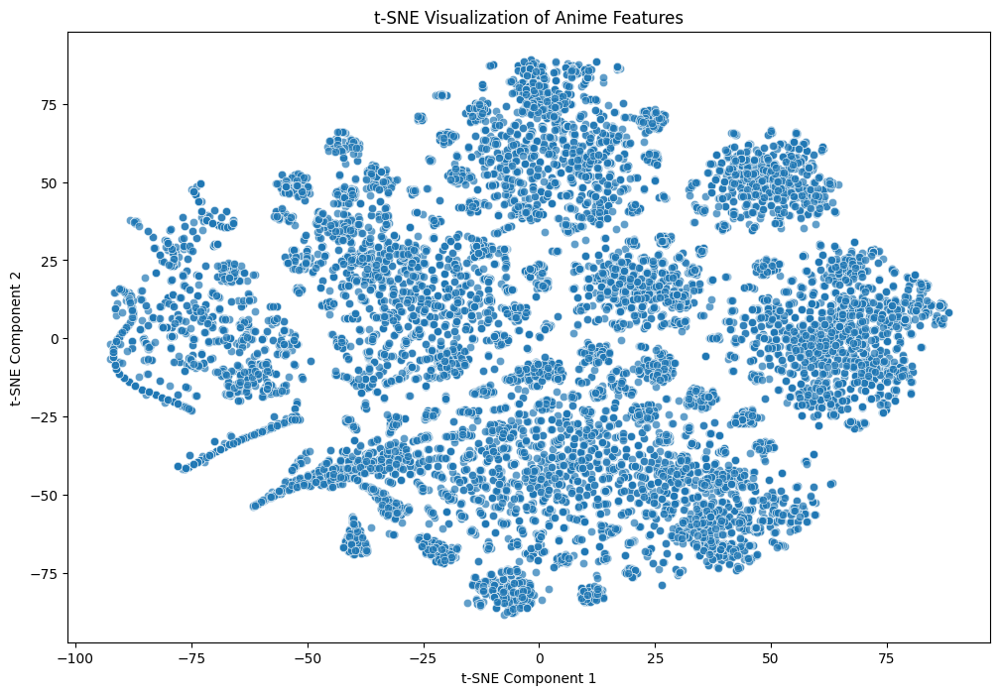

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import OneHotEncoder

# Load dataset (Ensure 'df' is preprocessed as per your steps)
# df = pd.read_csv("your_anime_data.csv")  # Update with the actual dataset file

# Fill NaN values
df['Tags'] = df['Tags'].fillna('')
df['Studios'] = df['Studios'].fillna('')
df['Type'] = df['Type'].fillna('Unknown')
df['Synopsis'] = df['Synopsis'].fillna('')

# Convert 'Number Votes' to numeric and scale it
df['Number Votes'] = pd.to_numeric(df['Number Votes'], errors='coerce').fillna(0)
scaler = StandardScaler()
scaled_votes = scaler.fit_transform(df[['Number Votes']])

# TF-IDF Vectorization for Tags
tag_vectorizer = TfidfVectorizer(stop_words='english', max_features=600)
tag_matrix = tag_vectorizer.fit_transform(df['Tags']).toarray()

# TF-IDF Vectorization for Synopsis
synopsis_vectorizer = TfidfVectorizer(stop_words='english', max_features=1500)
synopsis_matrix = synopsis_vectorizer.fit_transform(df['Synopsis']).toarray()

# One-Hot Encoding for Studios and Type
encoder = OneHotEncoder()
studios_encoded = encoder.fit_transform(df[['Studios']]).toarray()
type_encoded = encoder.fit_transform(df[['Type']]).toarray()

# Combine all features into a single matrix
features_combined = np.hstack([scaled_votes, tag_matrix, synopsis_matrix, studios_encoded, type_encoded])

print("Feature matrix shape:", features_combined.shape)

# Apply t-SNE (Reduce to 2D)
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_results = tsne.fit_transform(features_combined)

# Convert results into a DataFrame
df_tsne = pd.DataFrame(tsne_results, columns=["TSNE1", "TSNE2"])
df_tsne["anime_name"] = df["Name"]  # Add anime names for labeling

# Plot t-SNE results using Seaborn
plt.figure(figsize=(12, 8))
sns.scatterplot(x="TSNE1", y="TSNE2", data=df_tsne, alpha=0.7)

# Optional: Annotate some points for better understanding
# for i in range(0, len(df_tsne), len(df_tsne) // 50):  # Show ~50 labels
#     plt.text(df_tsne["TSNE1"][i], df_tsne["TSNE2"][i], df_tsne["anime_name"][i], fontsize=7)

plt.title("t-SNE Visualization of Anime Features")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.show()


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


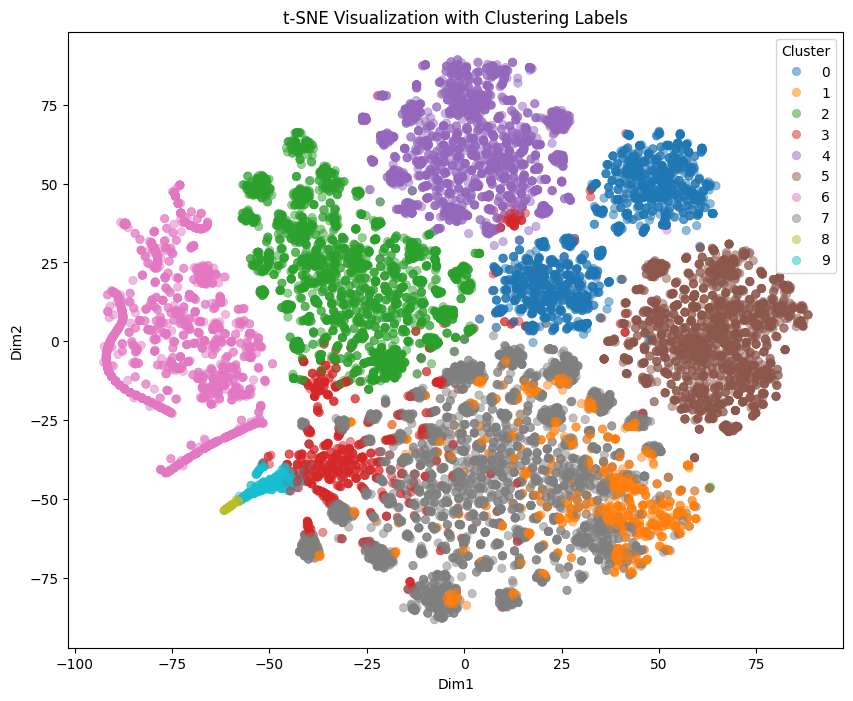

In [59]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

# Assuming 'features_combined' is already created
# If not, load or preprocess it as per your dataset

# Perform t-SNE for 2D visualization
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(features_combined)

# Clustering (if no labels exist)
num_clusters = 10  # Adjust as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
labels = kmeans.fit_predict(features_combined)  # Assign cluster labels

# Convert to DataFrame for easy plotting
df_tsne = pd.DataFrame(tsne_results, columns=['Dim1', 'Dim2'])
df_tsne['Cluster'] = labels

# Plot using Seaborn
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Dim1', y='Dim2', hue=df_tsne['Cluster'], palette='tab10', data=df_tsne, alpha=0.5, edgecolor=None)
plt.title("t-SNE Visualization with Clustering Labels")
plt.legend(title="Cluster")
plt.show()


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


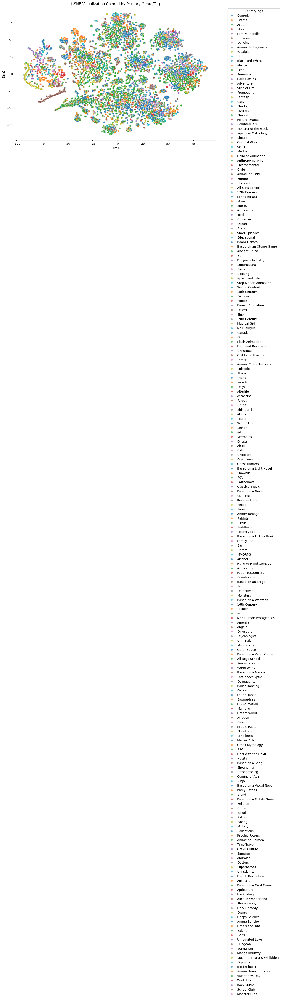

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Extract the first tag from the 'Tags' column
df['Primary_Tag'] = df['Tags'].apply(lambda x: x.split(',')[0] if isinstance(x, str) else 'Unknown')

# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(features_combined)

# Convert results to DataFrame
df_tsne = pd.DataFrame(tsne_results, columns=['Dim1', 'Dim2'])
df_tsne['Tag'] = df['Primary_Tag']

# Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Dim1', y='Dim2', hue=df_tsne['Tag'], palette='tab10', data=df_tsne, alpha=0.7)
plt.title("t-SNE Visualization Colored by Primary Genre/Tag")
plt.legend(title="Genres/Tags", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


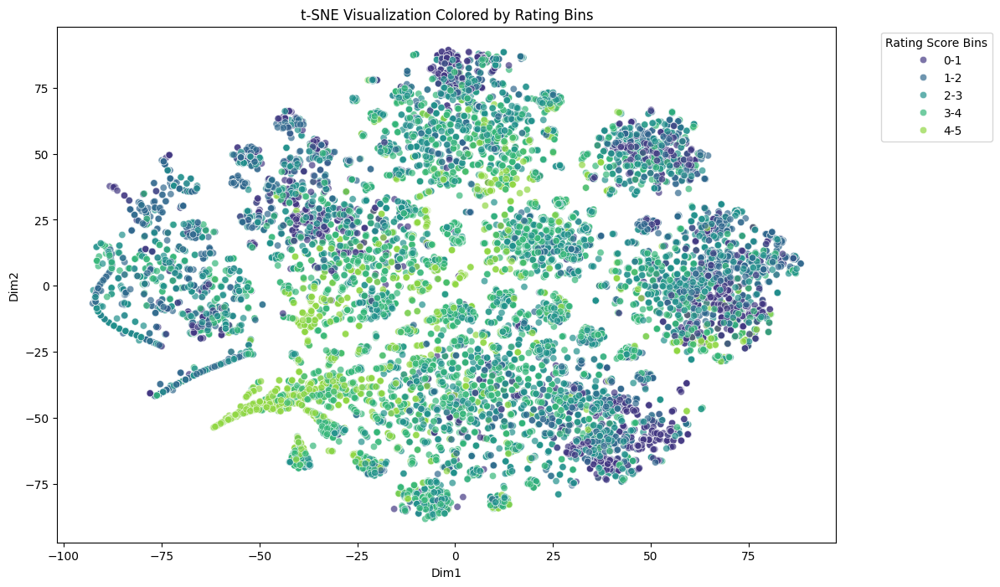

In [67]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Replace 'Unknown' with 0 in the Rating Score column
df['Rating Score'] = df['Rating Score'].replace('Unknown', 0).astype(float)

# Bin ratings into categories (0-1, 1-2, 2-3, etc.)
rating_bins = [0, 1, 2, 3, 4, 5]  # Define bins
rating_labels = ["0-1", "1-2", "2-3", "3-4", "4-5"]  # Labels for bins
df['Rating_Binned'] = pd.cut(df['Rating Score'], bins=rating_bins, labels=rating_labels, include_lowest=True)

# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(features_combined)

# Convert results to DataFrame
df_tsne = pd.DataFrame(tsne_results, columns=['Dim1', 'Dim2'])
df_tsne['Rating_Binned'] = df['Rating_Binned']

# Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Dim1', y='Dim2', hue=df_tsne['Rating_Binned'], palette='viridis', data=df_tsne, alpha=0.7)
plt.title("t-SNE Visualization Colored by Rating Bins")
plt.legend(title="Rating Score Bins", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [74]:
df['Tags'] = df ['Tags'].astype(str) 
df_exploded = df.assign(Tags=df['Tags'].str.split(',')).explode('Tags') 
df_exploded['Tags'] = df_exploded['Tags'].str.strip() 
tag_counts = df_exploded['Tags'].value_counts() 
x=tag_counts
print(x[:15])
# print(tag_counts.head(15)) 

Comedy                    4325
Based on a Manga          4124
Action                    3480
Fantasy                   2918
Sci Fi                    2479
Family Friendly           2296
Original Work             2174
Non-Human Protagonists    2080
Short Episodes            2001
Shounen                   1962
Adventure                 1775
Shorts                    1726
Drama                     1701
Romance                   1351
Animal Protagonists       1283
Name: Tags, dtype: int64


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


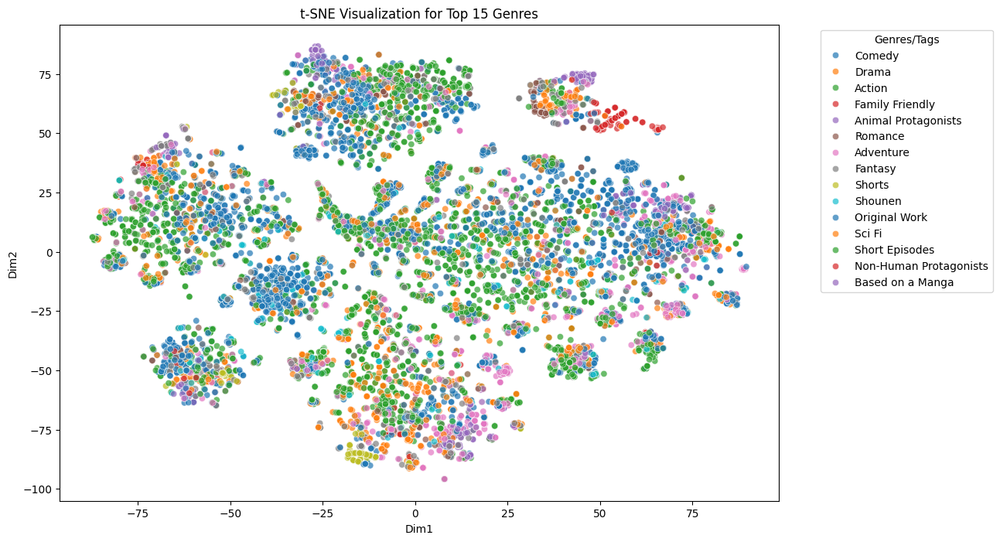

In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Extract the first tag from the 'Tags' column
df['Primary_Tag'] = df['Tags'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) else 'Unknown')

# Get the top 15 most frequent genres
df['Tags'] = df['Tags'].astype(str)
df_exploded = df.assign(Tags=df['Tags'].str.split(',')).explode('Tags')
df_exploded['Tags'] = df_exploded['Tags'].str.strip()
top_15_genres = df_exploded['Tags'].value_counts().head(15).index.tolist()

# Filter the dataset to include only these top genres
df_filtered = df[df['Primary_Tag'].isin(top_15_genres)].copy()

# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(features_combined[df_filtered.index])  # Use filtered index

# Convert results to DataFrame
df_tsne = pd.DataFrame(tsne_results, columns=['Dim1', 'Dim2'])
df_tsne['Tag'] = df_filtered['Primary_Tag'].values  # Assign filtered genre labels

# Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Dim1', y='Dim2', hue=df_tsne['Tag'], palette='tab10', data=df_tsne, alpha=0.7)
plt.title("t-SNE Visualization for Top 15 Genres")
plt.legend(title="Genres/Tags", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


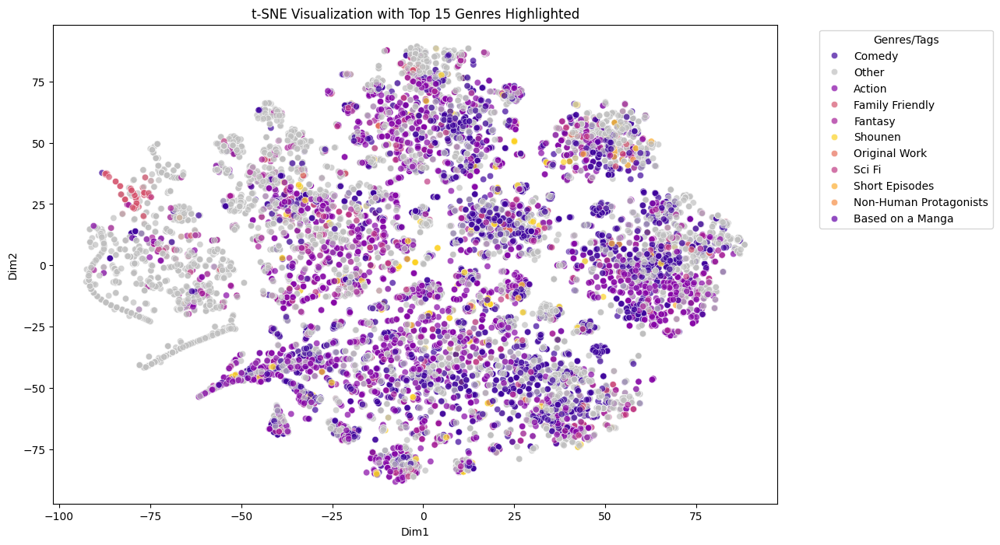

In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# Extract the first tag from the 'Tags' column
df['Primary_Tag'] = df['Tags'].apply(lambda x: x.split(',')[0].strip() if isinstance(x, str) else 'Unknown')

# Get the top 15 most frequent genres
df['Tags'] = df['Tags'].astype(str)
df_exploded = df.assign(Tags=df['Tags'].str.split(',')).explode('Tags')
df_exploded['Tags'] = df_exploded['Tags'].str.strip()
top_15_genres = df_exploded['Tags'].value_counts().head(10).index.tolist()

# Assign colors: top 15 genres get unique colors, others are 'gray'
df['Color'] = df['Primary_Tag'].apply(lambda x: x if x in top_15_genres else 'Other')

# Perform t-SNE
tsne = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
tsne_results = tsne.fit_transform(features_combined)  # Use full dataset

# Convert results to DataFrame
df_tsne = pd.DataFrame(tsne_results, columns=['Dim1', 'Dim2'])
df_tsne['Tag'] = df['Color'].values  # Assign filtered genre labels

# Define color palette: top 15 genres get unique colors, 'Other' is gray
palette = sns.color_palette('plasma', len(top_15_genres)) + [(0.75, 0.75, 0.75)]  # Gray for 'Other'
unique_labels = top_15_genres + ['Other']
color_dict = dict(zip(unique_labels, palette))

# Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Dim1', y='Dim2', hue=df_tsne['Tag'], palette=color_dict, data=df_tsne, alpha=0.7)
plt.title("t-SNE Visualization with Top 15 Genres Highlighted")
plt.legend(title="Genres/Tags", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
# from sklearn.decomposition import PCA
# from sklearn.metrics.pairwise import cosine_distances
# from scipy.spatial.distance import euclidean, cityblock, hamming, jaccard
# import matplotlib.pyplot as plt
# import pandas as pd

# # ✅ Define the top 10 anime manually
# top_10_anime_names = [
#     "Fullmetal Alchemist: Brotherhood",
#     "Attack on Titan The Final Season",
#     "Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train",
#     "Attack on Titan 3rd Season: Part II",
#     "Jujutsu Kaisen",
#     "Hunter x Hunter (2011)",
#     "Demon Slayer: Kimetsu no Yaiba",
#     "Gintama Kanketsu-hen: Yorozuya yo Eien Nare",
#     "Gintama (2015)",
#     "Mob Psycho 100 II"
# ]

# # ✅ Filter dataset for these anime
# top_10_anime = df[df["Name"].isin(top_10_anime_names)]

# # ✅ Get Naruto's index and feature vector
# anime1 = df[df["Name"].str.contains("Naruto", case=False, na=False)].index[0]
# naruto_vector = tag_matrix[anime1]

# # ✅ Store distances
# distances = []

# for anime_name in top_10_anime["Name"]:
#     anime_index = df[df["Name"] == anime_name].index[0]
#     anime_vector = tag_matrix[anime_index]

#     # ✅ Compute different distances
#     euclidean_dist = euclidean(naruto_vector, anime_vector)
#     manhattan_dist = cityblock(naruto_vector, anime_vector)
#     hamming_dist = hamming(naruto_vector, anime_vector)
#     jaccard_dist = jaccard(naruto_vector, anime_vector)
#     cosine_dist = cosine_distances([naruto_vector], [anime_vector])[0][0]

#     # ✅ Store results
#     distances.append([anime_name, euclidean_dist, manhattan_dist, hamming_dist, jaccard_dist, cosine_dist])

# # ✅ Print distances in a table format
# print("\n🔹 Distances Between Naruto and Top 10 Anime:\n")
# print(f"{'Anime Name':<50} {'Euclidean':<12} {'Manhattan':<12} {'Hamming':<12} {'Jaccard':<12} {'Cosine':<12}")
# print("=" * 90)
# for row in distances:
#     print(f"{row[0]:<50} {row[1]:<12.3f} {row[2]:<12.3f} {row[3]:<12.3f} {row[4]:<12.3f} {row[5]:<12.3f}")




🔹 Distances Between Naruto and Top 10 Anime:

Anime Name                                         Euclidean    Manhattan    Hamming      Jaccard      Cosine      
Demon Slayer: Kimetsu no Yaiba                     1.285        4.824        0.030        0.778        0.826       
Attack on Titan 3rd Season: Part II                1.290        4.531        0.025        0.733        0.833       
Attack on Titan The Final Season                   1.226        3.511        0.018        0.636        0.752       
Demon Slayer: Kimetsu no Yaiba Movie - Mugen Train 1.269        4.379        0.025        0.733        0.805       
Jujutsu Kaisen                                     1.215        3.389        0.018        0.636        0.738       
Fullmetal Alchemist: Brotherhood                   1.268        4.160        0.023        0.714        0.803       
Hunter x Hunter (2011)                             1.155        2.896        0.017        0.600        0.667       
Gintama Kanketsu-hen: Yor

C:\Users\acer\AppData\Roaming\Python\Python310\site-packages\umap\spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(


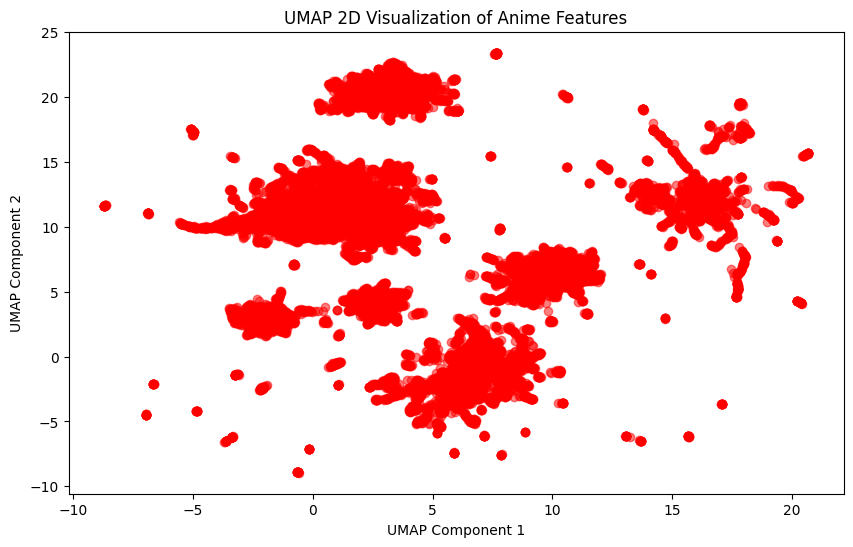

In [ ]:


# import umap

# # Reduce dimensions to 2D
# reducer = umap.UMAP(n_neighbors=10, min_dist=0.3, metric='euclidean')
# features_2D_umap = reducer.fit_transform(features_combined)

# # Plot
# plt.figure(figsize=(10, 6))
# plt.scatter(features_2D_umap[:, 0], features_2D_umap[:, 1], alpha=0.5, c='red')
# plt.xlabel("UMAP Component 1")
# plt.ylabel("UMAP Component 2")
# plt.title("UMAP 2D Visualization of Anime Features")
# plt.show()
